<a href="https://colab.research.google.com/github/swapnil2304/Own-chat-GPT/blob/main/SamMed2d_new_data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Enhancing Medical Image Segmentation with SAM_Med2D: An Evaluation on 3D image reconstruction for comparison of algorithm database (3DIRCADb) and Novel Annotated Dataset

# Installing Necessary Libraries and loading SAM_Med2D model

Explanation of Code - The code below mounts Google Drive to access files, installs essential libraries like pydicom for handling DICOM medical images and the segment-anything model for segmentation tasks. It then clones the SAM-Med2D repository, a specialized model for medical image segmentation. Afterward, it verifies the versions of PyTorch and Torchvision and checks if CUDA (GPU) is available for faster computation. Finally, it installs additional libraries such as opencv-python and matplotlib for image processing and visualization tasks.

In [ ]:
# Mounting the Google Drive
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


In [ ]:
# Installing the pydicom to work with dicom images
!pip install pydicom

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 39.2 MB/s eta 0:00:00


In [ ]:
!pip install segment-anything  # Installing segment anything model

In [ ]:
# Cloning the git repository for SAM-Med2D model
!git clone https://github.com/OpenGVLab/SAM-Med2D.git SAM_Med2D
import torch
import torchvision
print("PyTorch version:", torch.__version__)
print("Torchvision version:", torchvision.__version__)
print("CUDA is available:", torch.cuda.is_available())
import sys
!{sys.executable} -m pip install opencv-python matplotlib

Cloning into 'SAM_Med2D'...
remote: Enumerating objects: 350, done.
remote: Counting objects: 100% (160/160), done.
remote: Compressing objects: 100% (91/91), done.
remote: Total 350 (delta 125), reused 69 (delta 69), pack-reused 190 (from 1)
Receiving objects: 100% (350/350), 30.48 MiB | 21.77 MiB/s, done.
Resolving deltas: 100% (162/162), done.
PyTorch version: 2.4.0+cu121
Torchvision version: 0.19.0+cu121
CUDA is available: True


Explanation - The code below installs opencv-python and matplotlib, sets up directories, and authenticates Google Drive access using PyDrive to download the SAM-Med2D model weights. It defines a Downloader class to handle file downloads, then retrieves the SAM-Med2D model file (sam-med2d_b.pth) and stores it in the specified directory. The SAM-Med2D model is then loaded by appending the relevant path to the system. Using SammedPredictor, the model is prepared on the available device (GPU or CPU) for segmentation tasks with a set image size of 256 pixels.

In [ ]:
!pip install opencv-python matplotlib
import os
# Downloading the SAM-Med2D model weights
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials

ROOT_DIR = '.'
CODE_DIR = f"{ROOT_DIR}/SAM_Med2D"
MODEL_DIR = f"{CODE_DIR}/pretrain_model"
os.makedirs(f'{MODEL_DIR}', exist_ok=True)

class Downloader(object):
  def __init__(self, use_pydrive, save_dir='.'):
    self.use_pydrive = use_pydrive
    self.save_dir = save_dir
    if self.use_pydrive:
      self.authenticate()

  def authenticate(self):
    auth.authenticate_user()
    gauth = GoogleAuth()
    gauth.credentials = GoogleCredentials.get_application_default()
    self.drive = GoogleDrive(gauth)

  def download_file(self, file_id, file_name):
    file_dst = f'{self.save_dir}/{file_name}'
    if os.path.exists(file_dst):
      print(f'{file_name} already exists')
      return
    downloaded = self.drive.CreateFile({'id': file_id})
    downloaded.FetchMetadata(fetch_all=True)
    downloaded.GetContentFile(file_dst)

downloader = Downloader(True, MODEL_DIR)

sam_med2d_model = {'id': '1ARiB5RkSsWmAB_8mqWnwDF8ZKTtFwsjl', 'name': 'sam-med2d_b.pth'}
downloader.download_file(file_id=sam_med2d_model['id'], file_name=sam_med2d_model['name'])

# Loading SAM-med2d model to perform segmentation
import sys
sys.path.append(ROOT_DIR) # To make sure the import SAM_Med2D.segment_anything works

from SAM_Med2D.segment_anything import sam_model_registry
from SAM_Med2D.segment_anything.predictor_sammed import SammedPredictor
from argparse import Namespace

args = Namespace()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
args.image_size = 256
args.encoder_adapter = True
args.sam_checkpoint = f"{MODEL_DIR}/sam-med2d_b.pth"
model = sam_model_registry["vit_b"](args).to(device)
predictor = SammedPredictor(model)


/content/SAM_Med2D/segment_anything/build_sam.py:113: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f, map_location="cpu")


True
*******load ./SAM_Med2D/pretrain_model/sam-med2d_b.pth


In [ ]:
# Installing the other necessary libraries
!pip install tensorflow numpy matplotlib pydicom segmentation_models

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 4.8 MB/s eta 0:00:00


# Working with 3DIRCADB Dataset

# Extracting the data in Zip files

Explanation - This code extracts ZIP files from a specified directory, including nested ZIP files. It starts by defining a function extract_zip to extract the contents of a ZIP file to a target directory. Another function, extract_all_zips, recursively traverses through directories, identifies ZIP files, and extracts them into folders with the same name as the ZIP file. If a ZIP file is found within an extracted folder, it continues extracting recursively. The code then extracts the main ZIP file (3Dircadb1.zip) and handles any nested ZIP files found in the extraction process. Finally, it lists and displays the first 10 files from the extracted directories for verification.

In [ ]:
import os
import zipfile

# Function to extract a ZIP file
def extract_zip(zip_path, extract_to):
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_to)

# Function to recursively extracting the ZIP files from storage directory
def extract_all_zips(base_dir):
    # Looping over all files and subdirectories
    for root, dirs, files in os.walk(base_dir):
        for file in files:
            if file.endswith('.zip'):
                file_path = os.path.join(root, file)
                extract_to = os.path.splitext(file_path)[0]  # Extracting into a same named folder

                # Creating the extraction folder if it doesn't exist
                if not os.path.exists(extract_to):
                    os.makedirs(extract_to)

                print(f"Extracting {file_path} to {extract_to}...")
                try:
                    # Extracting the ZIP file
                    extract_zip(file_path, extract_to)
                except zipfile.BadZipFile:
                    print(f"Failed to extract {file_path}. Not a valid ZIP file.")

                # Recursively check if there are more ZIPs inside
                extract_all_zips(extract_to)

# Paths to your main ZIP file and the extraction directory
zip_path = '/content/drive/MyDrive/01 ECS8056  Project Folder/Working on 3DIRCADB/3Dircadb1.zip'
extract_to = '/content/drive/MyDrive/01 ECS8056  Project Folder/Working on 3DIRCADB/Extracted Files'

# Extracting the main ZIP file
extract_zip(zip_path, extract_to)

# Recursively extracting any nested ZIP files in the extracted directory
extract_all_zips(extract_to)

# Listing the contents of the extracted directory
extracted_files = []
for root, dirs, files in os.walk(extract_to):
    for file in files:
        extracted_files.append(os.path.join(root, file))

# Displaying the first 10 files for verification
extracted_files[:10]


Extracting /content/drive/MyDrive/01 ECS8056  Project Folder/Working on 3DIRCADB/Extracted Files/3Dircadb1/3Dircadb1.20/MASKS_DICOM.zip to /content/drive/MyDrive/01 ECS8056  Project Folder/Working on 3DIRCADB/Extracted Files/3Dircadb1/3Dircadb1.20/MASKS_DICOM...
Extracting /content/drive/MyDrive/01 ECS8056  Project Folder/Working on 3DIRCADB/Extracted Files/3Dircadb1/3Dircadb1.20/MESHES_VTK.zip to /content/drive/MyDrive/01 ECS8056  Project Folder/Working on 3DIRCADB/Extracted Files/3Dircadb1/3Dircadb1.20/MESHES_VTK...
Extracting /content/drive/MyDrive/01 ECS8056  Project Folder/Working on 3DIRCADB/Extracted Files/3Dircadb1/3Dircadb1.20/LABELLED_DICOM.zip to /content/drive/MyDrive/01 ECS8056  Project Folder/Working on 3DIRCADB/Extracted Files/3Dircadb1/3Dircadb1.20/LABELLED_DICOM...
Extracting /content/drive/MyDrive/01 ECS8056  Project Folder/Working on 3DIRCADB/Extracted Files/3Dircadb1/3Dircadb1.20/PATIENT_DICOM.zip to /content/drive/MyDrive/01 ECS8056  Project Folder/Working on 3DIRC

['/content/drive/MyDrive/01 ECS8056  Project Folder/Working on 3DIRCADB/Extracted Files/3Dircadb1/3Dircadb1.20/liver_20.jpg',
 '/content/drive/MyDrive/01 ECS8056  Project Folder/Working on 3DIRCADB/Extracted Files/3Dircadb1/3Dircadb1.20/LICENSE.txt',
 '/content/drive/MyDrive/01 ECS8056  Project Folder/Working on 3DIRCADB/Extracted Files/3Dircadb1/3Dircadb1.20/MASKS_DICOM.zip',
 '/content/drive/MyDrive/01 ECS8056  Project Folder/Working on 3DIRCADB/Extracted Files/3Dircadb1/3Dircadb1.20/MESHES_VTK.zip',
 '/content/drive/MyDrive/01 ECS8056  Project Folder/Working on 3DIRCADB/Extracted Files/3Dircadb1/3Dircadb1.20/LABELLED_DICOM.zip',
 '/content/drive/MyDrive/01 ECS8056  Project Folder/Working on 3DIRCADB/Extracted Files/3Dircadb1/3Dircadb1.20/PATIENT_DICOM.zip',
 '/content/drive/MyDrive/01 ECS8056  Project Folder/Working on 3DIRCADB/Extracted Files/3Dircadb1/3Dircadb1.20/MASKS_DICOM/MASKS_DICOM/liver/image_0',
 '/content/drive/MyDrive/01 ECS8056  Project Folder/Working on 3DIRCADB/Extrac

# Renaming files with .dcm extension for RAW data

Explanation - The below code adds the .dcm extension to files in a directory that do not have any extension but are valid DICOM files. It walks through the dataset directory and checks each file without an extension using the pydicom.dcmread method to determine if it's a valid DICOM file. If valid, it appends the .dcm extension to the filename. If the file is not a valid DICOM, it logs an error message. This process ensures that all valid DICOM files in the dataset are properly identified and named.

In [ ]:
# It is observed that most of the file in the dataset do not have any extensions
# So it is essential to provide them with .dcm extension
# So I initially found out the image files without any extension and appened .dcm with them
# Also dcmread method is used to read and check if the file is a valid dicom file or not
import os
import pydicom

def add_extension_if_dicom(path):
    for root, _, files in os.walk(path):    # Walking over the entire dataset
        for filename in files:
            file_path = os.path.join(root, filename)
            if '.' not in filename:  # If No extension to files
                try:
                    dicom_data = pydicom.dcmread(file_path, force=True)
                    # If it is a valid DICOM file, rename it with a .dcm extension
                    new_file_path = file_path + '.dcm'
                    os.rename(file_path, new_file_path)
                    print(f"Renamed {file_path} to {new_file_path}")
                except Exception as e:
                    print(f"File {file_path} is not a valid DICOM file: {e}")

# Calling the function
add_extension_if_dicom('/content/drive/MyDrive/01 ECS8056  Project Folder/Working on 3DIRCADB/Extracted Files/3Dircadb1')

# Calculating Total Number of Images and Displaying them (Done)

Explanation of code - The code below processes DICOM images in batches for a large dataset. It first defines a function, load_dicom_images_from_folder, to scan a directory and collect paths to files with the .dcm extension (DICOM images). The preprocess_images_in_batches function processes these images in batches (batch size of 100) to avoid memory overload. It reads each DICOM file, extracts the pixel data, resizes the images to a target size (512x512) using cubic interpolation, and normalizes the pixel values. The processed images are then passed to the plot_sample_images function, which displays a few sample images from the batch. Finally, the code outputs the total number of DICOM files found and processes them in batches.

Found 8469 DICOM files.


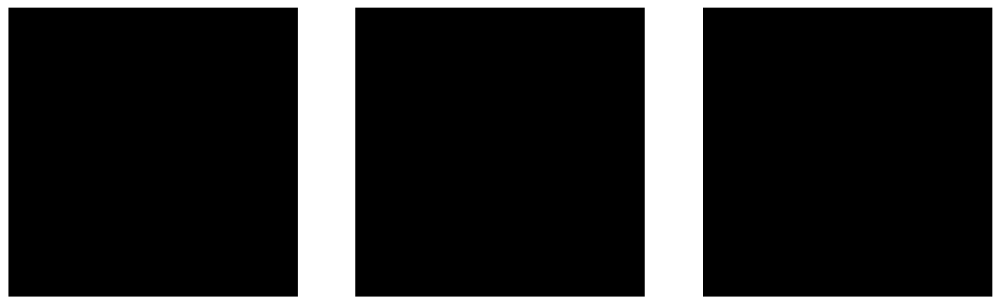

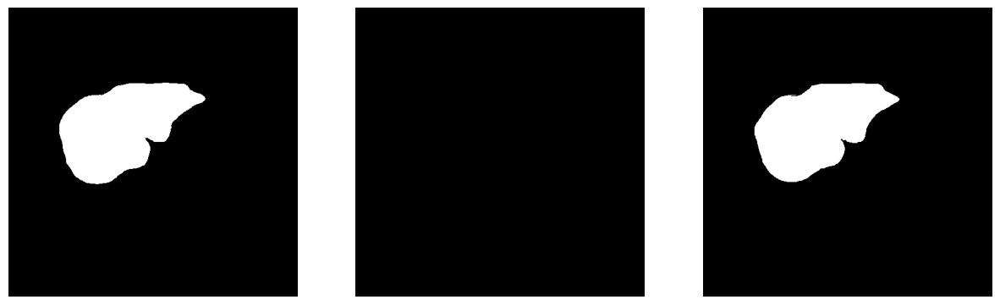

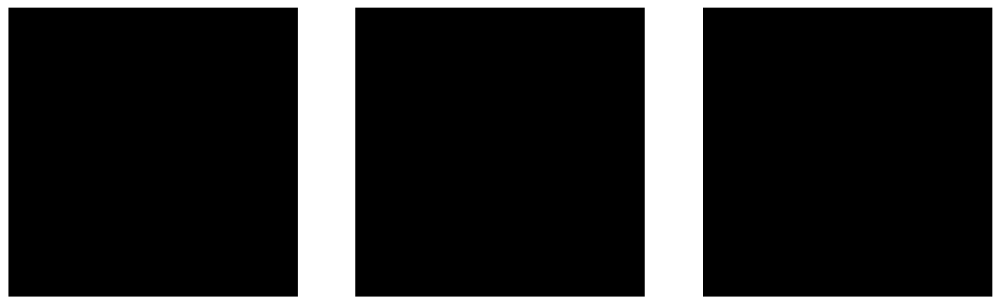

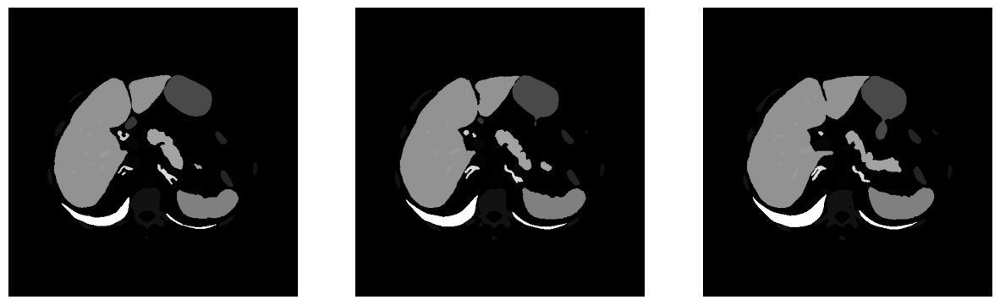

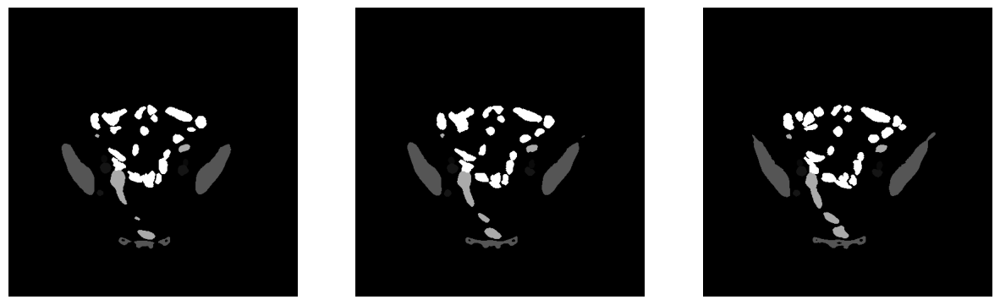

...

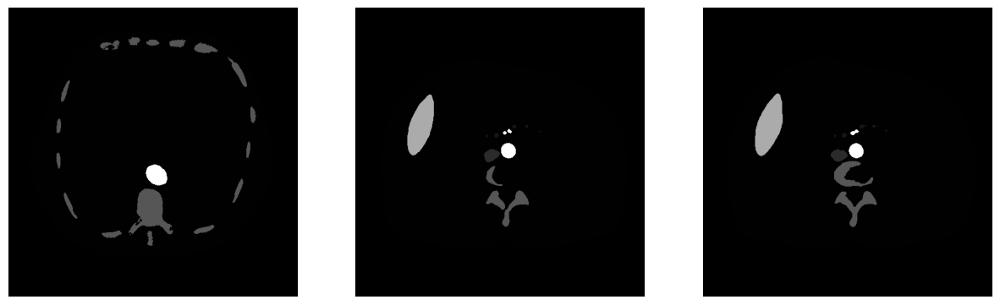

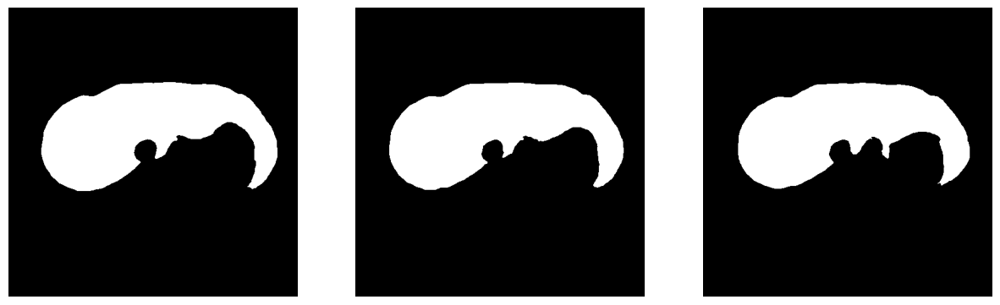

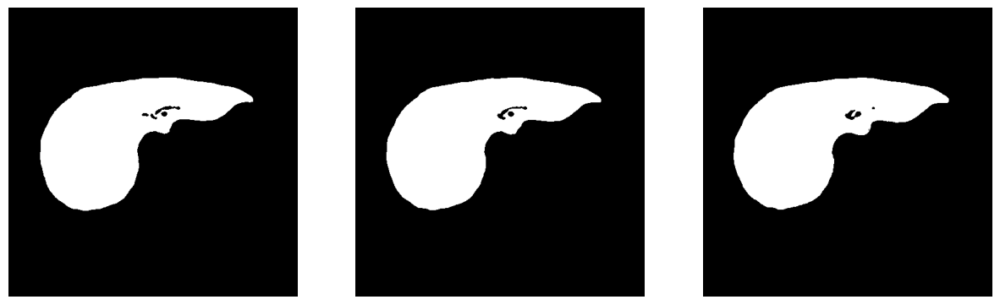

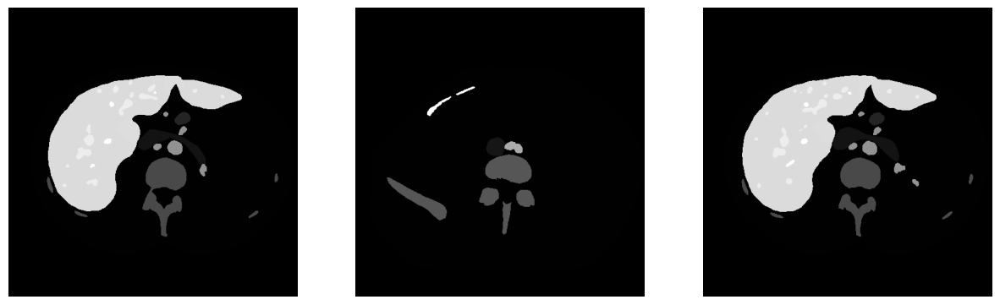

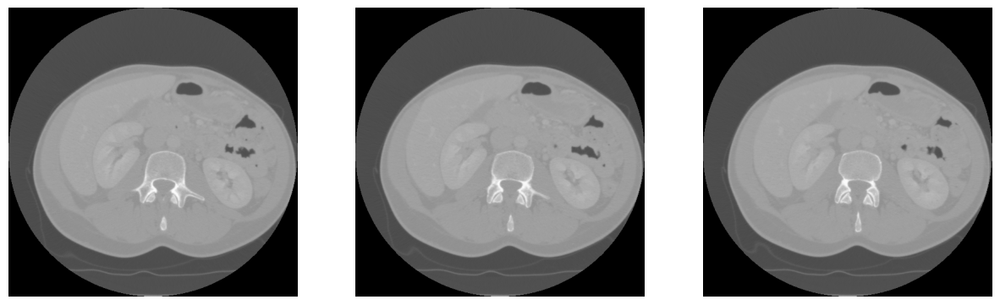

In [ ]:
# Next task is to find out the total number of Dicom images present in the dataset
# This data needs further slicing
import numpy as np
import matplotlib.pyplot as plt
from scipy.ndimage import zoom

def load_dicom_images_from_folder(folder_path):
    image_paths = []
    for root, _, files in os.walk(folder_path):
        for file in files:
            if file.endswith('.dcm'):  # Finding the images with .dcm extensions
                file_path = os.path.join(root, file)
                image_paths.append(file_path)
    return image_paths

def preprocess_images_in_batches(image_paths, target_size=(512, 512), batch_size=100):  # Since dataset is large I have chosen batch size of 100 to preprocess the images
    for i in range(0, len(image_paths), batch_size):
        batch_paths = image_paths[i:i + batch_size]  # Ensuring the last batch is also processed
        images = []
        for file_path in batch_paths:
            try:
                dicom_data = pydicom.dcmread(file_path)
                img = dicom_data.pixel_array  # getting the pixel array from the image
                zoom_factors = (target_size[0] / img.shape[0], target_size[1] / img.shape[1])
                resized_img = zoom(img, zoom_factors, order=3)  # Using cubic interpolation
                images.append(resized_img)
            except Exception as e:
                print(f"Failed to read or process DICOM file {file_path}: {e}")

        images = np.array(images, dtype=np.float32)
        images = (images - np.min(images)) / (np.max(images) - np.min(images))
        plot_sample_images(images)
# Plotting the sample images
def plot_sample_images(images, num_samples=3):
    if len(images) == 0:
        print("No images to display.")
        return

    plt.figure(figsize=(15, 5))
    for i in range(min(num_samples, len(images))):
        plt.subplot(1, num_samples, i + 1)
        plt.imshow(images[i], cmap='gray')
        plt.axis('off')
    plt.show()

# Displaying number of images found
dicom_folder = '/content/drive/MyDrive/01 ECS8056  Project Folder/Working on 3DIRCADB/Extracted Files/3Dircadb1'
image_paths = load_dicom_images_from_folder(dicom_folder)
print(f"Found {len(image_paths)} DICOM files.")

preprocess_images_in_batches(image_paths, target_size=(512, 512), batch_size=100)

# SAM_Med2D execution on 3DIRCADb Dataset

Explanation - The code below processes DICOM images and segmentation masks from a dataset, calculates evaluation metrics (Jaccard Index and Dice Score), and visualizes the results for each patient.

Model Initialization: It sets up the SAM-MED2D model for medical image segmentation using pre-trained weights.

Metrics Calculation: A function computes Jaccard and Dice scores by comparing true segmentation masks with predicted ones.

Post-Processing: A post-processing function cleans up the predicted segmentation masks by applying operations like binary closing, dilation, and erosion to remove noise.

Data Loading and Extraction: It searches for and extracts DICOM files from ZIP archives in a directory, ensuring all files are valid and have a .dcm extension.

Image Processing: For each patient, DICOM images and masks are processed. The images are normalized, and the segmentation model predicts masks. The Jaccard and Dice scores are calculated by comparing the predicted and true masks.

Results Visualization: The Jaccard and Dice scores for each patient are plotted as bar graphs, with average scores displayed for comparison.

The code ensures each patient’s DICOM images are segmented and analyzed, and the segmentation performance is evaluated through these metrics.

/content/SAM_Med2D/segment_anything/build_sam.py:113: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f, map_location="cpu")


True
*******load /content/SAM_Med2D/pretrain_model/sam-med2d_b.pth
Processing patient 3Dircadb1.1
Number of image files: 129
Number of mask files: 129
No regions found in mask: /tmp/tmptvnlhwup/MASKS_DICOM/MASKS_DICOM/liver/image_0.dcm
No regions found in mask: /tmp/tmptvnlhwup/MASKS_DICOM/MASKS_DICOM/liver/image_1.dcm
No regions found in mask: /tmp/tmptvnlhwup/MASKS_DICOM/MASKS_DICOM/liver/image_10.dcm
No regions found in mask: /tmp/tmptvnlhwup/MASKS_DICOM/MASKS_DICOM/liver/image_11.dcm
No regions found in mask: /tmp/tmptvnlhwup/MASKS_DICOM/MASKS_DICOM/liver/image_12.dcm
No regions found in mask: /tmp/tmptvnlhwup/MASKS_DICOM/MASKS_DICOM/liver/image_125.dcm
No regions found in mask: /tmp/tmptvnlhwup/MASKS_DICOM/MASKS_DICOM/liver/image_126.dcm
No regions found in mask: /tmp/tmptvnlhwup/MASKS_DICOM/MASKS_DICOM/liver/image_127.dcm
No regions found in mask: /tmp/tmptvnlhwup/MASKS_DICOM/MASKS_DICOM/liver/image_128.dcm
No regions found in mask: /tmp/tmptvnlhwup/MASKS_DICOM/MASKS_DICOM/liver/

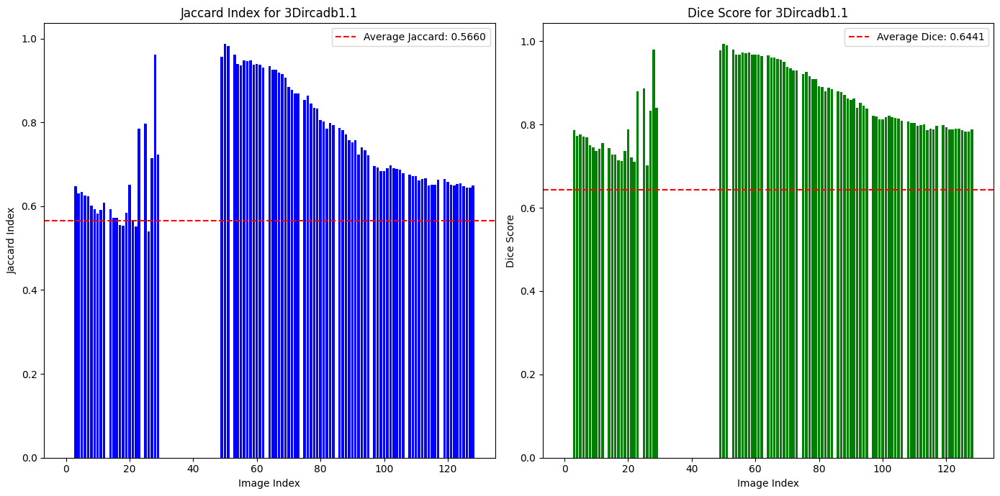

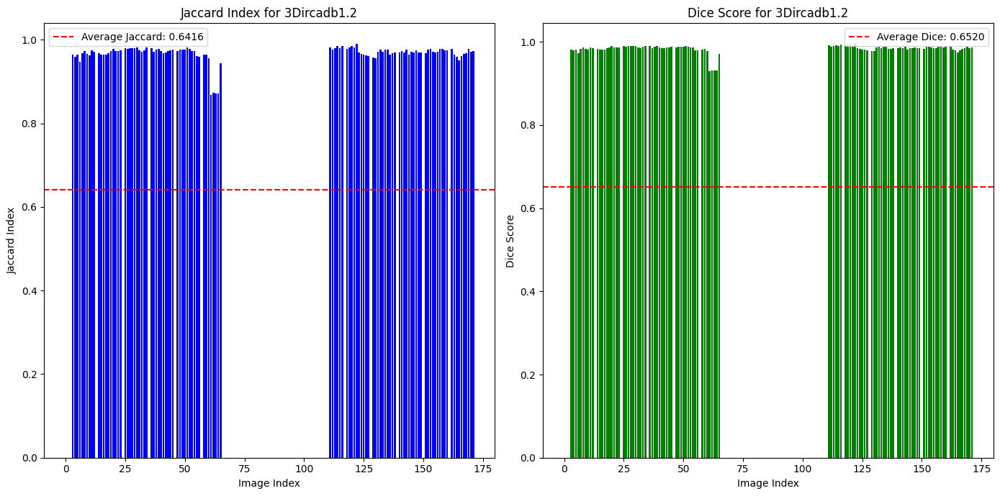

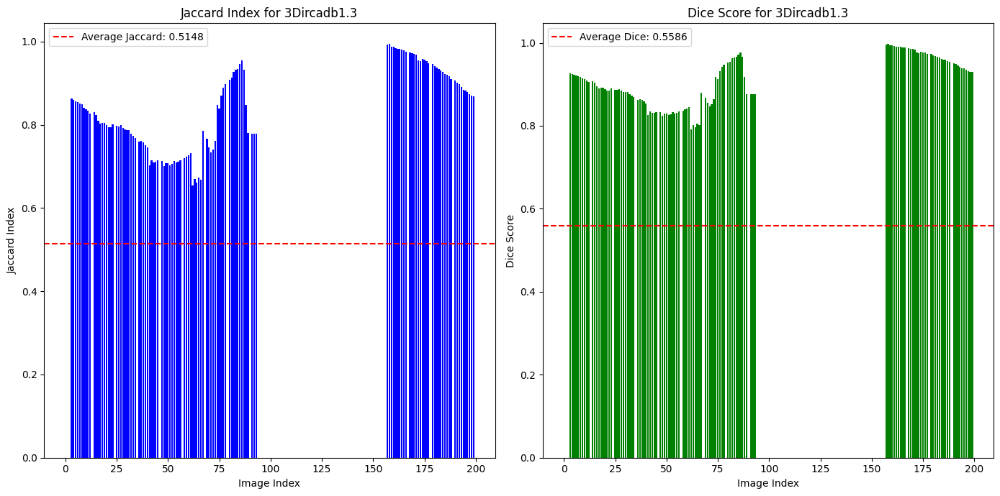

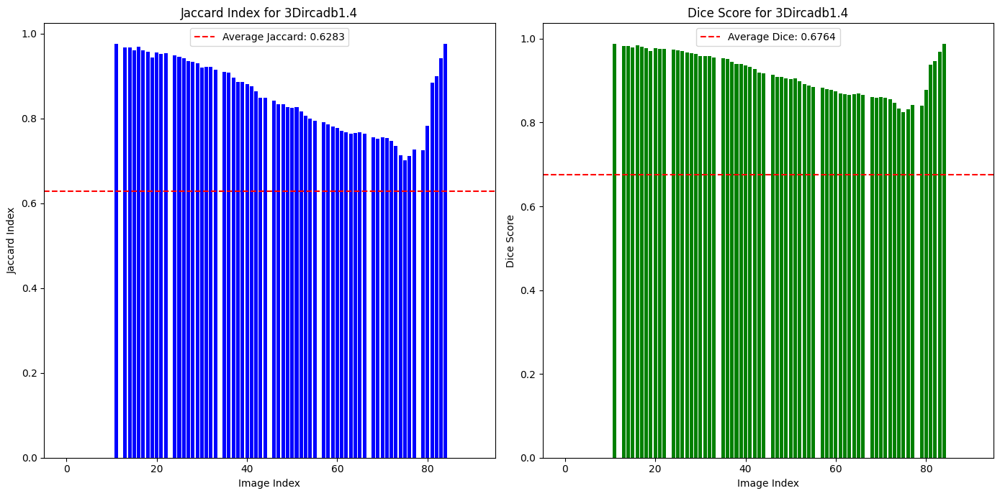

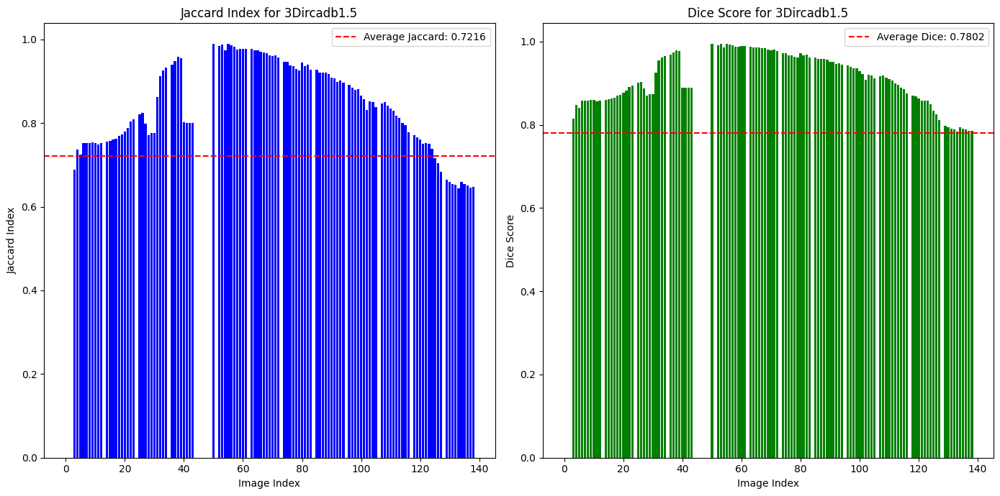

...

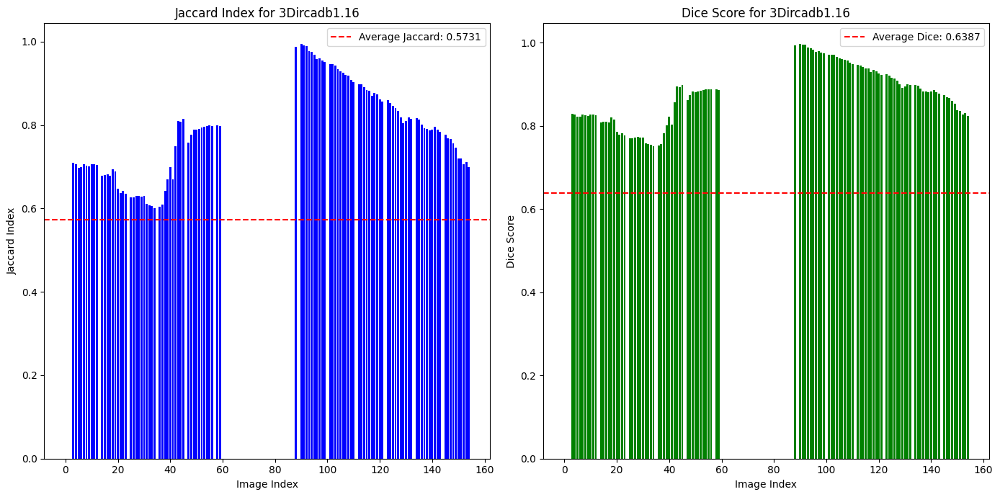

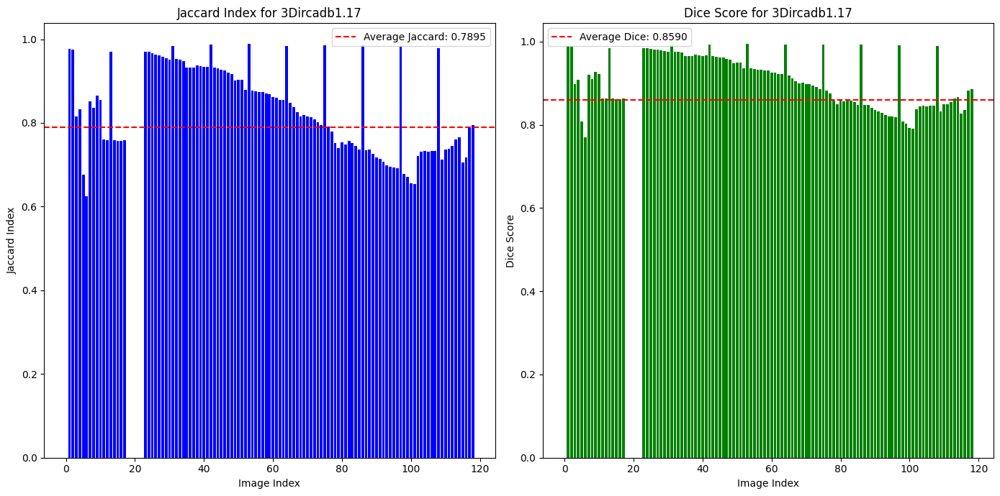

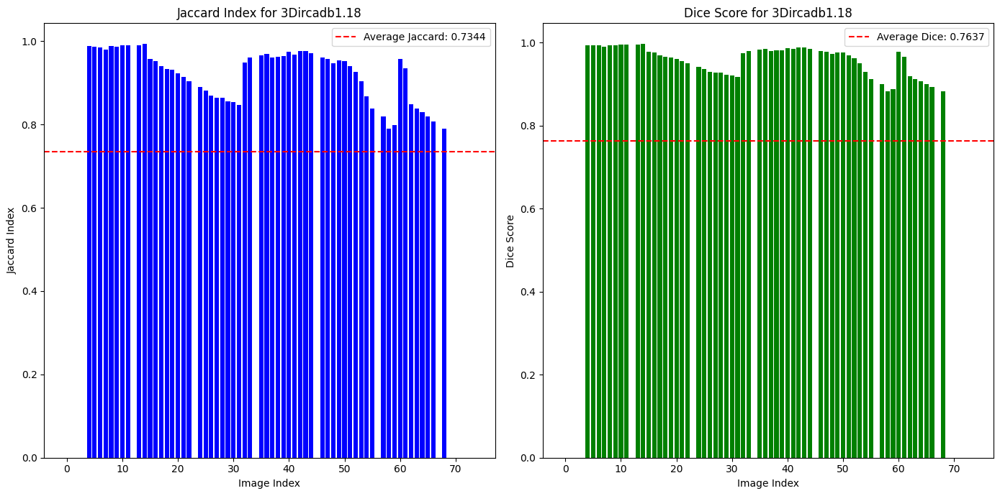

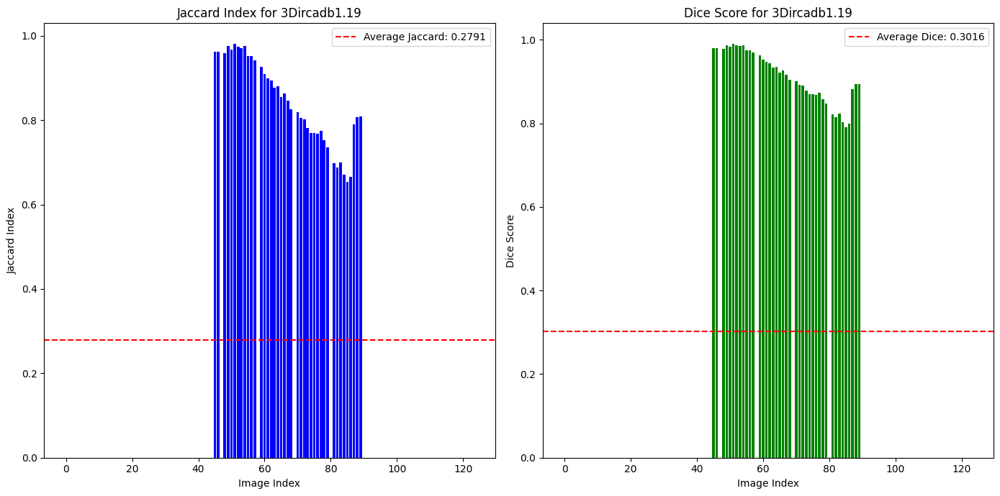

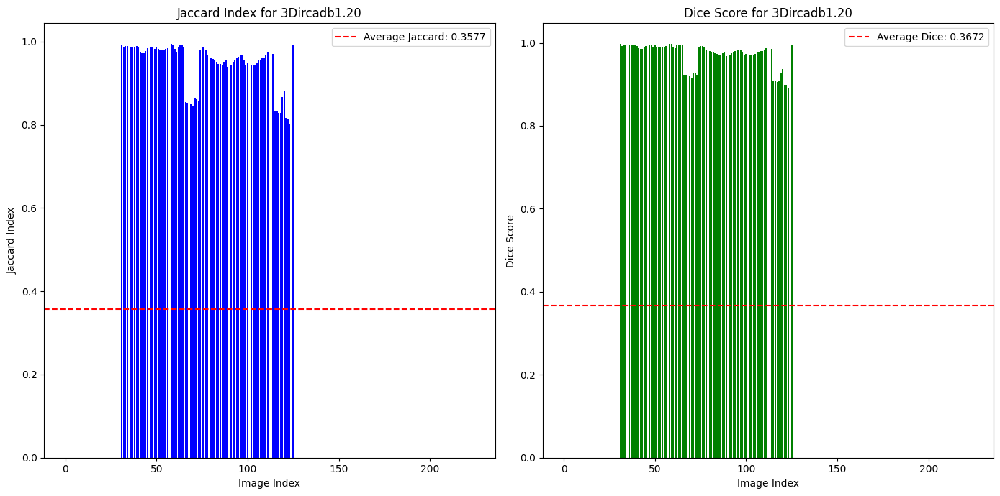

In [ ]:
# Importing necessary libraries
import os
import numpy as np
import torch
import matplotlib.pyplot as plt
import pydicom
import seaborn as sns
from segment_anything import sam_model_registry, SamPredictor
from sklearn.metrics import jaccard_score, f1_score
from argparse import Namespace
from scipy.ndimage import binary_closing, binary_opening, binary_dilation, binary_erosion
from skimage.measure import label, regionprops
from skimage.segmentation import clear_border
import random
import zipfile
import tempfile

# Setting up SAM-MED2D model
from SAM_Med2D.segment_anything import sam_model_registry
from SAM_Med2D.segment_anything.predictor_sammed import SammedPredictor

# Initializing the SAM model
args = Namespace()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
args.image_size = 256
args.encoder_adapter = True
args.sam_checkpoint = "/content/SAM_Med2D/pretrain_model/sam-med2d_b.pth"
model = sam_model_registry["vit_b"](args).to(device)
predictor = SammedPredictor(model)

# Function to calculate Jaccard and Dice scores
def calculate_metrics(true_mask, pred_mask):
    true_mask = true_mask.flatten()
    pred_mask = pred_mask.flatten()
    jaccard = jaccard_score(true_mask, pred_mask, average='micro')
    dice = f1_score(true_mask, pred_mask, average='micro')
    return jaccard, dice

# Post-processing function for the predicted mask
def post_process_mask(mask, min_size=100):
    mask = clear_border(mask).astype(np.uint8)
    mask = binary_closing(mask, structure=np.ones((7,7))).astype(np.uint8)
    mask = binary_opening(mask, structure=np.ones((7,7))).astype(np.uint8)
    mask = binary_dilation(mask, structure=np.ones((5,5))).astype(np.uint8)
    mask = binary_erosion(mask, structure=np.ones((5,5))).astype(np.uint8)

    labeled_mask = label(mask)
    for region in regionprops(labeled_mask):
        if region.area < min_size:
            mask[labeled_mask == region.label] = 0
    return mask

# Function to find DICOM files in a directory
def find_dicom_files(root_dir):
    dicom_files = []
    for root, _, files in os.walk(root_dir):
        for file in files:
            if not file.endswith('.dcm'):
                file_path = os.path.join(root, file)
                new_file_path = file_path + '.dcm'
                os.rename(file_path, new_file_path)
                dicom_files.append(new_file_path)
            else:
                dicom_files.append(os.path.join(root, file))
    return sorted(dicom_files)

# Function to verify and extract ZIP files
def verify_and_extract(zip_path, extract_to):
    with zipfile.ZipFile(zip_path, 'r') as zip_ref:
        zip_ref.extractall(extract_to)

    extracted_files = [os.path.join(extract_to, f) for f in os.listdir(extract_to)]
    if all(os.path.isdir(f) for f in extracted_files):
        extracted_files = [os.path.join(f, subf) for f in extracted_files for subf in os.listdir(f)]

    return extracted_files

# Function to process images and compute Jaccard and Dice scores
def process_image(image_path, mask_path):
    try:
        dicom = pydicom.dcmread(image_path)
        image = dicom.pixel_array

        true_mask_dicom = pydicom.dcmread(mask_path)
        true_mask = true_mask_dicom.pixel_array

        image = ((image - image.min()) / (image.max() - image.min()) * 255).astype(np.uint8)
        image = np.expand_dims(image, axis=-1)
        image = np.repeat(image, 3, axis=-1)

        labeled_mask = label(true_mask)
        props = regionprops(labeled_mask)
        if not props:
            print(f"No regions found in mask: {mask_path}")
            return image, np.zeros_like(true_mask), np.zeros_like(true_mask), (0.0, 0.0)  # Return empty masks and 0 scores

        min_row, min_col, max_row, max_col = props[0].bbox

        padding = 10
        min_row = max(0, min_row - padding)
        min_col = max(0, min_col - padding)
        max_row = min(true_mask.shape[0], max_row + padding)
        max_col = min(true_mask.shape[1], max_col + padding)

        input_box = np.array([min_col, min_row, max_col, max_row])

        predictor.set_image(image)

        center_point = np.array([(min_col + max_col) // 2, (min_row + max_row) // 2])
        prompts = [
            {"box": input_box[None, :]},
            {"point_coords": center_point[None, :], "point_labels": np.array([1])},
            {"point_coords": np.array([[min_col, min_row], [max_col, max_row]]), "point_labels": np.array([1, 1])},
        ]

        all_masks = []
        all_scores = []
        for prompt in prompts:
            masks, scores, logits = predictor.predict(**prompt, multimask_output=True)
            all_masks.extend(masks)
            all_scores.extend(scores)

        weighted_masks = np.average(all_masks, axis=0, weights=all_scores)
        ensemble_mask = weighted_masks > 0.3
        predicted_mask = post_process_mask(ensemble_mask)

        jaccard, dice = calculate_metrics(true_mask, predicted_mask)

        return image, true_mask, predicted_mask, (jaccard, dice)
    except Exception as e:
        print(f"Error processing image {image_path}: {str(e)}")
        return None, None, None, None

# Base path where DICOM files are stored
base_path = '/content/drive/MyDrive/01 ECS8056  Project Folder/Working on 3DIRCADB/Extracted Files/3Dircadb1'
results = []

# Dictionary to store Jaccard and Dice scores per patient
patient_metrics = {}

# Processing each patient and calculating metrics
for i in range(1, 21):
    patient_folder = f'3Dircadb1.{i}'
    patient_path = os.path.join(base_path, patient_folder)

    patient_dicom_zip = os.path.join(patient_path, 'PATIENT_DICOM.zip')
    masks_dicom_zip = os.path.join(patient_path, 'MASKS_DICOM.zip')

    if not (os.path.exists(patient_dicom_zip) and os.path.exists(masks_dicom_zip)):
        print(f"Zip files not found for patient {patient_folder}")
        continue

    with tempfile.TemporaryDirectory() as temp_dir:
        patient_dicom_folder = os.path.join(temp_dir, 'PATIENT_DICOM')
        masks_dicom_folder = os.path.join(temp_dir, 'MASKS_DICOM')

        # Unzipping and verifying extracted paths
        patient_dicom_files = verify_and_extract(patient_dicom_zip, patient_dicom_folder)
        masks_dicom_files = verify_and_extract(masks_dicom_zip, masks_dicom_folder)

        # Ensuring extracted files have the correct .dcm extension
        image_files = find_dicom_files(patient_dicom_folder)
        mask_files = find_dicom_files(masks_dicom_folder)

        print(f"Processing patient {patient_folder}")
        print(f"Number of image files: {len(image_files)}")
        print(f"Number of mask files: {len(mask_files)}")

        patient_jaccard_scores = []
        patient_dice_scores = []

        for img_file, mask_file in zip(image_files, mask_files):
            result = process_image(img_file, mask_file)
            if result[0] is not None:
                results.append((patient_folder, os.path.basename(img_file), *result))
                # Collecting Jaccard and Dice scores for this patient
                patient_jaccard_scores.append(result[3][0])  # Jaccard score
                patient_dice_scores.append(result[3][1])     # Dice score

        # Storing metrics for this patient
        if patient_jaccard_scores and patient_dice_scores:
            patient_metrics[patient_folder] = {
                'jaccard': patient_jaccard_scores,
                'dice': patient_dice_scores
            }

# Plotting for each patient
for patient_folder, metrics in patient_metrics.items():
    jaccard_scores = metrics['jaccard']
    dice_scores = metrics['dice']

    plt.figure(figsize=(14, 7))

    # Bar plot for Jaccard scores for this patient
    plt.subplot(1, 2, 1)
    plt.bar(range(len(jaccard_scores)), jaccard_scores, color="b")
    plt.axhline(y=np.mean(jaccard_scores), color='r', linestyle='--', label=f'Average Jaccard: {np.mean(jaccard_scores):.4f}')
    plt.title(f"Jaccard Index for {patient_folder}")
    plt.xlabel("Image Index")
    plt.ylabel("Jaccard Index")
    plt.legend()

    # Bar plot for Dice scores for this patient
    plt.subplot(1, 2, 2)
    plt.bar(range(len(dice_scores)), dice_scores, color="g")
    plt.axhline(y=np.mean(dice_scores), color='r', linestyle='--', label=f'Average Dice: {np.mean(dice_scores):.4f}')
    plt.title(f"Dice Score for {patient_folder}")
    plt.xlabel("Image Index")
    plt.ylabel("Dice Score")
    plt.legend()

    plt.tight_layout()
    plt.show()

# Average Graph for Jaccard Index and Dice Score for 3DIRCADb

Explanation - The below code calculates and visualizes the average Jaccard and Dice scores across 20 patients. It ensures that each patient is represented, even if some patients are missing data. For each patient (from index 1 to 20), it computes the mean Jaccard and Dice scores using the patient_metrics dictionary. If a patient has no scores, it defaults to 0.

The code generates two bar plots:

Jaccard Score Bar Plot: Displays the average Jaccard scores for each patient. It also plots a red dashed line showing the overall average Jaccard score across all patients.
Dice Score Bar Plot: Similarly, this plot shows the average Dice scores for each patient, with a red dashed line indicating the overall average Dice score.
The x-axis labels correspond to the patient indices (1 to 20), and the y-axes display the respective scores.

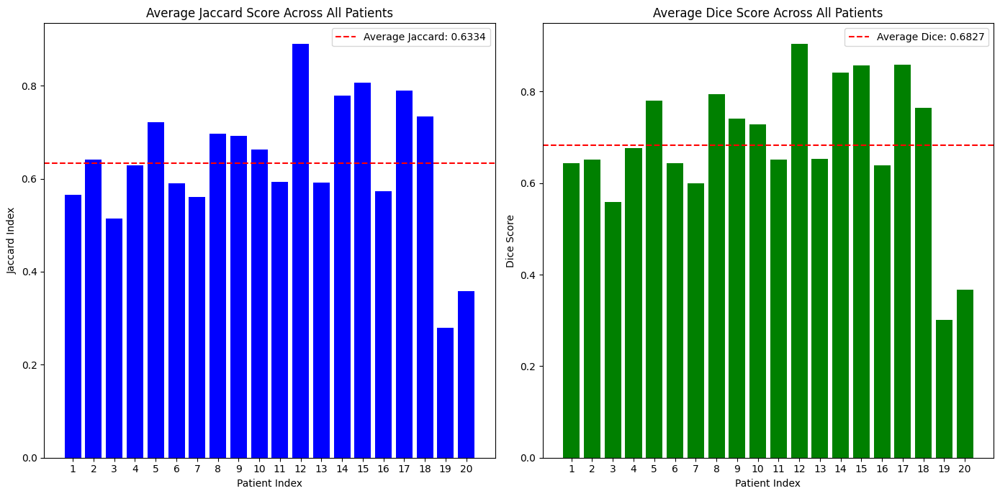

In [ ]:
# Getting the values for all jaccard index and dice scores from previous code
all_jaccard_scores = [np.mean(patient_metrics.get(f'3Dircadb1.{i}', {'jaccard': [0]})['jaccard']) for i in range(1, 21)]
all_dice_scores = [np.mean(patient_metrics.get(f'3Dircadb1.{i}', {'dice': [0]})['dice']) for i in range(1, 21)]

plt.figure(figsize=(14, 7))

# Bar plot for average Jaccard scores across all patients
plt.subplot(1, 2, 1)
plt.bar(range(1, len(all_jaccard_scores) + 1), all_jaccard_scores, color="b")
plt.axhline(y=np.mean(all_jaccard_scores), color='r', linestyle='--', label=f'Average Jaccard: {np.mean(all_jaccard_scores):.4f}')
plt.title("Average Jaccard Score Across All Patients")
plt.xlabel("Patient Index")
plt.ylabel("Jaccard Index")
plt.xticks(range(1, len(all_jaccard_scores) + 1))  # Setting the x-ticks to match the patient indices starting from 1
plt.legend()

# Bar plot for average Dice scores across all patients
plt.subplot(1, 2, 2)
plt.bar(range(1, len(all_dice_scores) + 1), all_dice_scores, color="g")
plt.axhline(y=np.mean(all_dice_scores), color='r', linestyle='--', label=f'Average Dice: {np.mean(all_dice_scores):.4f}')
plt.title("Average Dice Score Across All Patients")
plt.xlabel("Patient Index")
plt.ylabel("Dice Score")
plt.xticks(range(1, len(all_dice_scores) + 1))  # Setting the x-ticks to match the patient indices starting from 1
plt.legend()

plt.tight_layout()
plt.show()


# Sample Segmentation Images

Explanation - The code below defines two functions to visualize the segmentation results of medical images. The visualize_segmentation function displays four panels: the original image with the file name, the true mask, the image with a bounding box (showing the region of interest), and the predicted mask, along with the Jaccard and Dice scores.

The visualize_random_samples function randomly selects 20 samples from the results dataset and visualizes the segmentation for each. It extracts the bounding box of the true mask using region properties and passes the necessary information (image, true mask, predicted mask, bounding box, and metrics) to the visualize_segmentation function for display. This approach provides an easy way to review and analyze model performance across random samples.

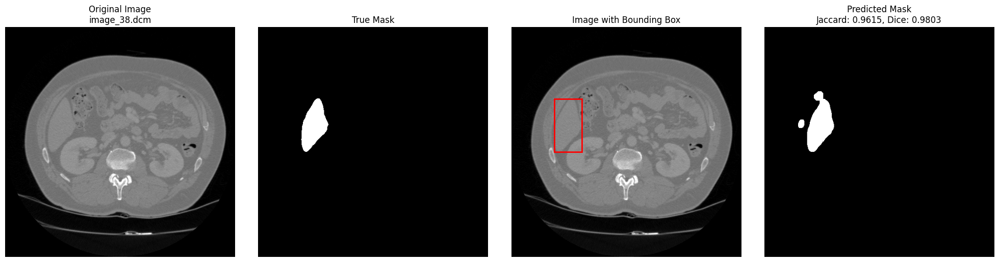

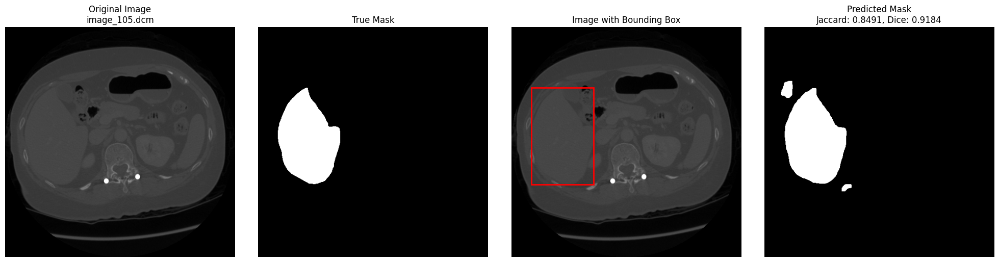

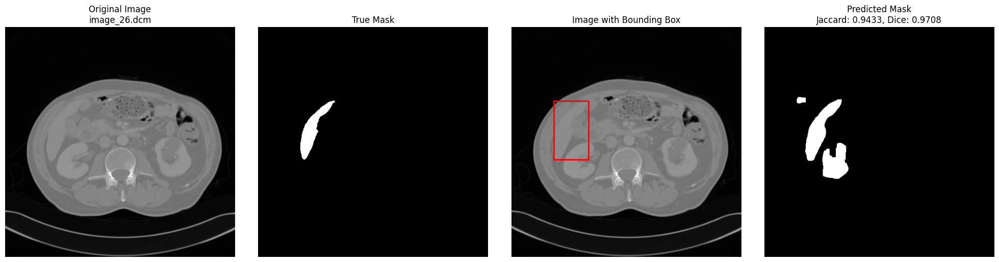

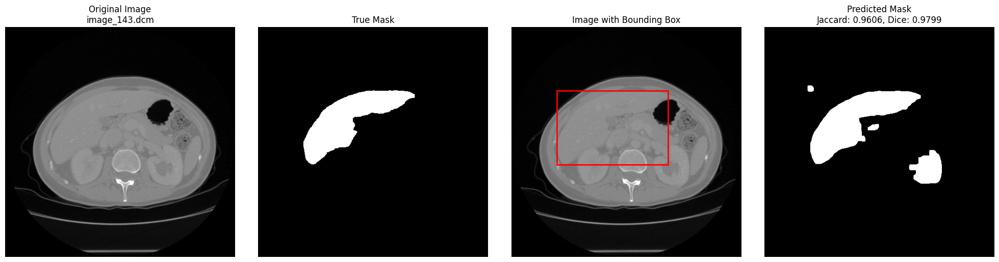

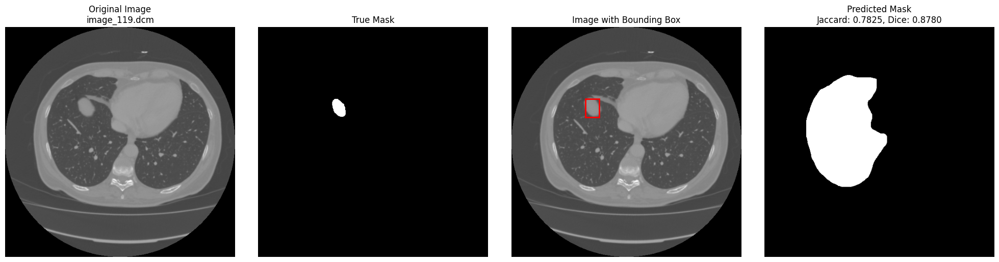

...

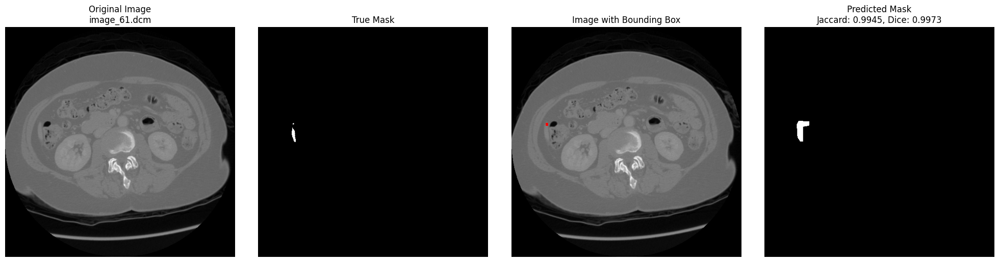

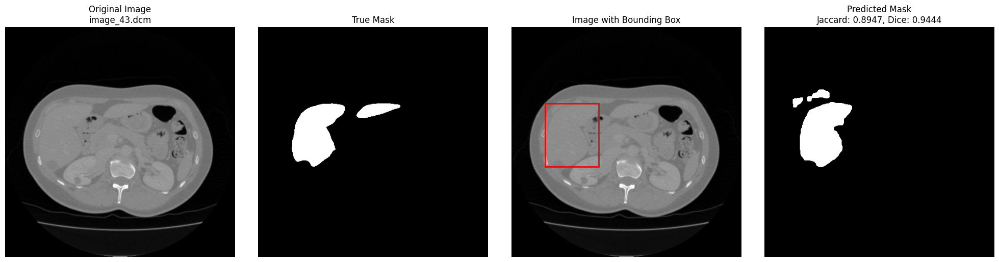

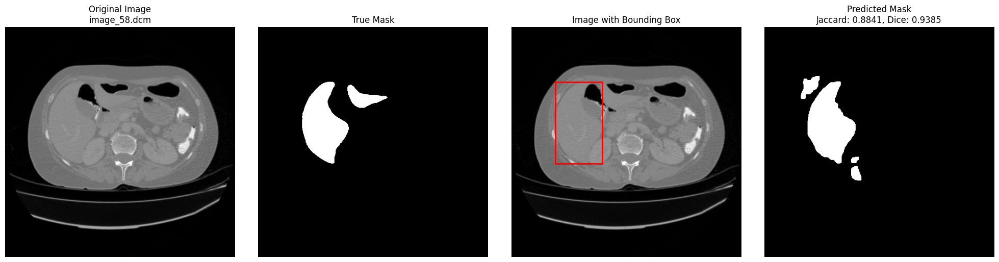

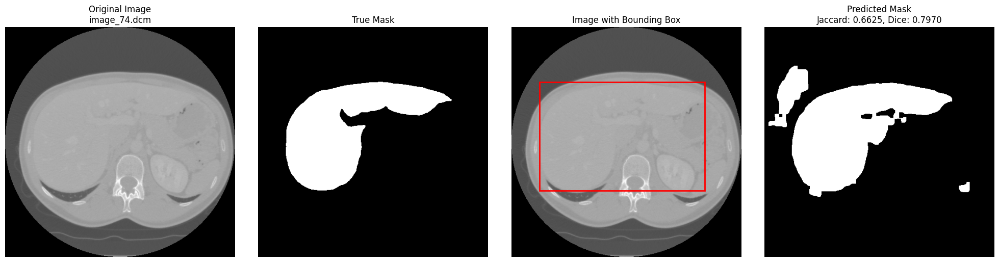

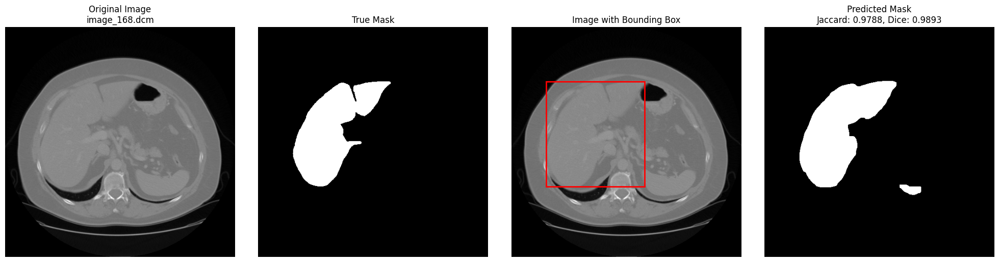

In [ ]:
import matplotlib.pyplot as plt

# Function to visualize the segmentation process
def visualize_segmentation(image, true_mask, predicted_mask, input_box, jaccard, dice, filename):
    fig, axs = plt.subplots(1, 4, figsize=(20, 5))

    # Original image
    axs[0].imshow(image, cmap='gray')
    axs[0].set_title(f"Original Image\n{filename}")
    axs[0].axis('off')

    # True Mask
    axs[1].imshow(true_mask, cmap='gray')
    axs[1].set_title("True Mask")
    axs[1].axis('off')

    # Image with Bounding Box
    axs[2].imshow(image, cmap='gray')
    axs[2].add_patch(plt.Rectangle((input_box[0], input_box[1]), input_box[2] - input_box[0], input_box[3] - input_box[1],
                                   edgecolor='red', facecolor='none', lw=2))
    axs[2].set_title("Image with Bounding Box")
    axs[2].axis('off')

    # Predicted Mask
    axs[3].imshow(predicted_mask, cmap='gray')
    axs[3].set_title(f"Predicted Mask\nJaccard: {jaccard:.4f}, Dice: {dice:.4f}")
    axs[3].axis('off')

    plt.tight_layout()
    plt.show()

# Function to randomly select 20 samples and visualize their segmentation
def visualize_random_samples(results, num_samples=20):
    # Selecting random 20 samples from the results
    random_samples = random.sample(results, num_samples)

    for sample in random_samples:
        patient_folder, img_filename, image, true_mask, predicted_mask, (jaccard, dice) = sample

        # Bounding box is inferred from the regionprops of the true mask
        labeled_mask = label(true_mask)
        props = regionprops(labeled_mask)
        if not props:
            continue

        min_row, min_col, max_row, max_col = props[0].bbox
        input_box = [min_col, min_row, max_col, max_row]

        # Visualize the segmentation along with the filename
        visualize_segmentation(image, true_mask, predicted_mask, input_box, jaccard, dice, img_filename)

# Results contains the processed images and masks as in the previous code
visualize_random_samples(results, num_samples=20)


# Working with Liver Transplant Segmentation Dataset (LTSD)

# Extracting the Zip Files

Explanation - This code extracts DICOM files from ZIP archives stored in a source folder, including handling nested ZIP files. It recursively searches for ZIP files, extracts their contents to a specified destination folder, and counts the total number of DICOM files (.dcm format) found. The process is logged, providing details such as when ZIP files are extracted, how many DICOM files are discovered, and when nested ZIPs are processed. The script uses the logging module for real-time feedback on the extraction process and tracks the total number of DICOM files extracted.









In [ ]:
import os
import zipfile
import logging

# Configuring logging information
logging.basicConfig(level=logging.INFO, format='%(asctime)s - %(levelname)s - %(message)s')

# Function to extract a ZIP file.
def extract_zip(zip_file_path, extract_to):
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        zip_ref.extractall(extract_to)
    logging.info(f"Extracted ZIP file: {zip_file_path} to {extract_to}")

# Function to count the DICOM Files in the directory
def count_dicom_files(directory):
    dicom_count = 0
    for root, _, files in os.walk(directory):
        for file in files:
            if file.endswith('.dcm'):
                dicom_count += 1
    return dicom_count
total_count = 0

# Function to extract all DICOM files from ZIP files.
def extract_dicom_files_from_zips(source_folder, destination_folder):
    # Recursively extracting DICOM files from ZIP files, including ZIP files inside ZIPs.
    # Also counting the total number of DICOM files extracted.
    total_dicom_count = 0  # Variable to track total number of DICOM files

    # Checking if the destination folder exists, otherwise creating it
    if not os.path.exists(destination_folder):
        os.makedirs(destination_folder)
        logging.info(f"Created destination folder: {destination_folder}")

    # Walk through the source folder to find all ZIP files
    for root, dirs, files in os.walk(source_folder):
        for file in files:
            if file.endswith('.zip'):
                zip_file_path = os.path.join(root, file)
                logging.info(f"Processing ZIP file: {zip_file_path}")

                # Temporary folder to extract the contents of this zip file
                temp_extract_path = os.path.join(destination_folder, os.path.splitext(file)[0])

                if not os.path.exists(temp_extract_path):
                    os.makedirs(temp_extract_path)

                # Extracting the outer ZIP file
                extract_zip(zip_file_path, temp_extract_path)

                # Counting the DICOM files in the extracted folder
                dicom_count = count_dicom_files(temp_extract_path)
                total_dicom_count += dicom_count
                logging.info(f"Found {dicom_count} DICOM files in ZIP file: {zip_file_path}")

                # Checking for nested ZIP files within the extracted contents
                for root_extracted, dirs_extracted, files_extracted in os.walk(temp_extract_path):
                    for inner_file in files_extracted:
                        if inner_file.endswith('.zip'):
                            inner_zip_file_path = os.path.join(root_extracted, inner_file)
                            logging.info(f"Found inner ZIP file: {inner_zip_file_path}")

                            # Recursively extract inner ZIP files
                            inner_extract_path = os.path.join(temp_extract_path, os.path.splitext(inner_file)[0])
                            if not os.path.exists(inner_extract_path):
                                os.makedirs(inner_extract_path)
                            extract_zip(inner_zip_file_path, inner_extract_path)

                            # Counting the DICOM files in the inner ZIP folder
                            inner_dicom_count = count_dicom_files(inner_extract_path)
                            total_dicom_count += inner_dicom_count
                            logging.info(f"Found {inner_dicom_count} DICOM files in inner ZIP file: {inner_zip_file_path}")

                logging.info(f"Finished processing: {zip_file_path}")

    logging.info(f"All ZIP files have been extracted. Total DICOM files found: {total_dicom_count}")
    total_count = total_dicom_count


# Paths to source and destination folders
source_folder = '/content/drive/MyDrive/Volumetrias'
destination_folder = '/content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images'

# Calling the function
extract_dicom_files_from_zips(source_folder, destination_folder)
#print(f"Total number of Dicom Files Present in New Dataset: {total_count}")


Total number of Dicom Files Present in New Dataset: 0


# Plotting Jaccard Index and Dice for Individual Patients and Average of all patients

Explanation -
This code processes DICOM images from a specified folder, generates true and predicted masks for each image, and evaluates the predicted mask's accuracy by comparing it to the true mask using various metrics such as Jaccard Index, Dice Score, and the confusion matrix (true negatives, false positives, false negatives, and true positives).

Functions:
calculate_metrics_and_confusion: This function calculates the Jaccard Index, Dice Score, and confusion matrix for each image. These metrics are used to measure how well the predicted mask matches the true mask.

get_true_mask_from_contours: This function generates a ground truth mask by identifying specific colors in the image, based on predefined color ranges in HSV (Hue, Saturation, Value) format. It creates a binary mask that highlights regions matching these color ranges.

get_bounding_box_from_contours: This function finds the bounding box of the largest contour in the image, which is used to guide the segmentation model in predicting a mask.

post_process_mask: This function post-processes the predicted mask by applying morphological operations (closing, opening, dilation, and erosion) to remove noise and refine the mask.

predict_new_image: This function handles the DICOM file reading and mask prediction using the SAM model. It processes the image, uses the bounding box to generate prompts for the segmentation model, and returns the post-processed predicted mask.

process_images_and_compare: This is the main function that iterates over folders of DICOM images, calculates the true and predicted masks, and computes the Jaccard Index, Dice Score, and confusion matrix for each image. The results are collected and visualized through bar charts showing the distribution of Jaccard and Dice scores for each folder and for the entire dataset.

Metrics & Visualization:
The code tracks the number of true positives, false positives, true negatives, and false negatives for each image. It calculates average Jaccard and Dice scores and displays these metrics as bar plots for individual folders and combined for all images across folders. The evaluation helps assess the quality of segmentation by showing how close the predicted mask is to the true mask.

Color Ranges:
The color ranges in HSV format help in detecting certain regions of interest in the images, such as different anatomical parts, which are used to generate the true mask. The predicted mask from the SAM model is then compared to this ground truth for evaluation.

Usage:
The extracted_dicom_folder path specifies the folder where DICOM images are stored, and the code processes all images in that folder by applying the segmentation model and evaluating its performance. The results are displayed in charts for easy interpretation of the model's accuracy across different images.

Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0001.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0003.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0002.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0004.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0005.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0007.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0006.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0008.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0009.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0010.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0011.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0012.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0013.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0014.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0015.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0016.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0017.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0018.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0019.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0020.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0021.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0022.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0023.dcm...
Processed IM-0001-0023.dcm: Jaccard = 0.3731, Dice = 0.5435
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0024.dcm...
Processed IM-0001-0024.dcm: Jaccard = 0.5519, Dice = 0.7112
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0025.dcm...
Processed IM-0001-0025.dcm: Jaccard = 0.7724, Dice = 0.8716
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0026.dcm...
Processed IM-0001-0026.dcm: Jaccard = 0.5901, Dice = 0.7422
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0027.dcm...
Processed IM-0001-0027.dcm: Jaccard = 0.7614, Dice = 0.8646
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0029.dcm...
Processed IM-0001-0029.dcm: Jaccard = 0.9113, Dice = 0.953

Processed IM-0001-0077.dcm: Jaccard = 0.4953, Dice = 0.6625
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0079.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0078.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0082.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0081.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0080.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0083.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0085.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0086.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0084.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0089.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0087.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0088.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0090.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0092.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0091.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0093.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0094.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0096.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0095.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0097.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0100.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0099.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0098.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0101.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0103.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0102.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0104.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0105.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0106.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0107.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0108.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0109.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0110.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0112.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0111.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0113.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0114.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0115.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0116.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0117.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0118.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0119.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0120.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0122.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0121.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0123.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0126.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0124.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0125.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0127.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0128.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0129.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0130.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0132.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0131.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0133.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0134.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0135.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0136.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0137.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0140.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0139.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0138.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0141.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0142.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0143.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0144.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0145.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0147.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0146.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0148.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0150.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0149.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0152.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0151.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0153.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0154.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0155.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0156.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0157.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0158.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0159.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0160.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0161.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0162.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0163.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0164.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0166.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0165.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0167.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0168.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0169.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0170.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0171.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0172.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0174.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0173.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0175.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0177.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0178.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0176.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0179.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0180.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0181.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0182.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0183.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0185.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0184.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0186.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0187.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0189.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0188.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0191.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0190.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0192.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0193.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0195.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0194.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0196.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0197.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0199.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0198.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0200.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0201.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0202.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0203.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0204.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0205.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0206.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0207.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0208.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0209.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0210.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0211.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0213.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0212.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0214.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0216.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0215.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0217.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0218.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0220.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0219.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0221.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0223.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0222.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0224.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0225.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0226.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0227.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0228.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0229.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0230.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0232.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0231.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0233.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0234.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0235.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0236.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/II e III/IM-0001-0237.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0003.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0002.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0004.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0001.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0006.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0005.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0007.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0008.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0009.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0010.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0011.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0012.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0013.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0014.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0015.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0016.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0017.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0018.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0019.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0021.dcm...


Processed IM-0001-0021.dcm: Jaccard = 0.6610, Dice = 0.7959
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0020.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0023.dcm...
Processed IM-0001-0023.dcm: Jaccard = 0.6576, Dice = 0.7934
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0022.dcm...
Processed IM-0001-0022.dcm: Jaccard = 0.8092, Dice = 0.8946
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0024.dcm...
Processed IM-0001-0024.dcm: Jaccard = 0.2914, Dice = 0.4513
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0025.dcm...
Processed IM-0001-0025.dcm: Jaccard = 0.5140, Dice = 0.6790
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0026.dcm...
Processed IM-0001-0026.dcm: Jaccar

Processed IM-0001-0133.dcm: Jaccard = 0.2415, Dice = 0.3890
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0135.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0134.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0136.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0138.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0137.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0139.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0140.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0141.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0142.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0143.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0144.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0145.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0146.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0147.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0148.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0149.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0150.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0151.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0152.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0153.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0154.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0156.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0155.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0157.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0158.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0159.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0160.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0161.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0163.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0162.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0165.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0164.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0166.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0167.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0168.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0171.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0170.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0169.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0172.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0173.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0175.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0176.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0174.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0177.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0179.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0178.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0180.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0181.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0182.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0183.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0184.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0185.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0186.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0187.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0189.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0190.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0188.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0191.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0192.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0193.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0194.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0195.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0196.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0197.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0198.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0199.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0200.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0201.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0202.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0203.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0204.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0205.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0206.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0208.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0209.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0207.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0210.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0212.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0211.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0214.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0213.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0215.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0216.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0217.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0218.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0219.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0221.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0220.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0222.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0223.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0224.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0225.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0226.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0227.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0228.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0229.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0230.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0231.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0232.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0233.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0235.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0234.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0236.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Total volume/IM-0001-0237.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0001.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0002.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0003.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0005.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0004.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0006.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0008.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0007.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0010.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0009.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0011.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0012.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0013.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0014.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0015.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0016.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0018.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0017.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0019.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0020.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0021.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0022.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0023.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0024.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0025.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0026.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0027.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0028.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0029.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0030.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0031.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0032.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0033.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0034.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0035.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0036.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0037.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0038.dcm...
Processed IM-0001-0038.dcm: Jaccard = 0.6875, Dice = 0.8148
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0039.dcm...
Processed IM-0001-0039.dcm: Jaccard = 0.8309, Dice = 0.9076
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0040.dcm...
Processed IM-0001-0040.dcm: Jaccard = 0.6012, Dice = 0.7509
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0041.dcm...
Processed IM-0001-0041.dcm: Jaccard = 0.3372, Dice = 0.5044
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0042.dcm...
Processed IM-0001-0042.dcm: Jaccard = 0.5444, Dice = 0.7050
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom

Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0130.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0131.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0132.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0133.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0134.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0136.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0135.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0137.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0138.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0139.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0140.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0141.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0142.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0143.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0144.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0145.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0146.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0147.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0148.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0149.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0150.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0151.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0152.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0153.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0154.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0155.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0157.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0156.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0159.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0158.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0160.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0161.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0163.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0162.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0164.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0165.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0166.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0167.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0169.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0168.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0170.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0171.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0172.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0173.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0174.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0175.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0176.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0177.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0178.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0179.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0180.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0181.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0182.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0183.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0184.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0185.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0186.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0187.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0189.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0188.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0190.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0192.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0191.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0193.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0194.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0195.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0197.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0196.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0198.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0199.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0200.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0201.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0202.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0203.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0204.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0205.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0206.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0207.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0208.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0209.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0210.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0211.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0213.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0212.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0214.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0215.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0216.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0217.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0218.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0219.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0221.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0220.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0222.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0223.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0224.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0226.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0225.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0227.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0230.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0229.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0228.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0231.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0232.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0233.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0235.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0234.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0236.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0237.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0238.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0239.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0240.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0241.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0242.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0243.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0244.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0245.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0246.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0247.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0248.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0249.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0250.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0252.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0251.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0253.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0254.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0255.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0256.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0257.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0258.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0259.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0260.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0261.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0263.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0262.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0264.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0265.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0266.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0268.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0267.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0270.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0271.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0269.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0272.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0273.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0275.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0274.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0276.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0277.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0278.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0280.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0279.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0281.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0282.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0283.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0284.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0285.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0286.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0287.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0288.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0289.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0290.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0291.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0292.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0293.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0294.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0295.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0296.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0297.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0298.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0299.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0300.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0301.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0302.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0303.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0304.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0305.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0306.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0307.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0308.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0309.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0310.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0311.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0312.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0313.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0314.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0315.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0316.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0317.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0318.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0319.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0321.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0322.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0320.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0324.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0323.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0326.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0325.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0328.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0329.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0327.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0330.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0333.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0331.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0332.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0334.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0336.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0335.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0337.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0338.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0339.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0340.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0341.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0342.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0344.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0343.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0345.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0347.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0346.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0348.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0349.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0351.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0350.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0352.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0354.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0353.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0356.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0355.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0357.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0359.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0358.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0360.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0361.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0362.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0363.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0364.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0365.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0366.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0367.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0368.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0370.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0369.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0371.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0373.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0374.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0372.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0376.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0375.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0378.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0377.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0379.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0380.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - II e III/IM-0001-0381.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0383.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0382.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0385.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0384.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0386.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0387.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0388.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0389.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0390.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0391.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0392.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0393.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0394.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0395.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0396.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0397.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0399.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0398.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0400.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0401.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0402.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0403.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0405.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0404.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0406.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0407.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0408.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0409.dcm...
Processed IM-0001-0409.dcm: Jaccard = 0.5315, Dice = 0.6941
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0411.dcm...
Processed IM-0001-0411.dcm: Jaccard = 0.4581, Dice = 0.6283
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0410.dcm...
Processed IM-0001-0410.dcm: Jaccard = 0.3320, Dice = 0.4985
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0412.dcm...
Processed IM-0001-0412.dcm: Jaccard = 0.6771, Dice = 0.8074
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0413.dcm...
Processed IM-0001-0413.dcm: Jaccard = 0.6157, Dice = 0.7621
Processing /content/drive/MyDrive/01 ECS8056  Proj

Processed IM-0001-0548.dcm: Jaccard = 0.5438, Dice = 0.7045
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0550.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0549.dcm...


Processed IM-0001-0549.dcm: Jaccard = 0.2580, Dice = 0.4101
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0551.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0552.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0553.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0554.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0555.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0557.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0556.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0558.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0559.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0560.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0561.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0562.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0563.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0564.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0565.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0566.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0568.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0567.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0569.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0570.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0571.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0572.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0573.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0574.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0575.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0577.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0576.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0578.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0579.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0580.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0581.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0582.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0583.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0584.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0585.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0586.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0588.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0587.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0589.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0590.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0591.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0592.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0593.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0594.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0595.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0596.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0597.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0598.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0600.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0599.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0601.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0602.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0603.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0605.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0604.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0606.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0607.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0609.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0608.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0611.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0610.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0612.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0615.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0613.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0614.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0616.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0617.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0618.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0619.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0621.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0620.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0622.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0623.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0624.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0625.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0626.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0627.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0628.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0629.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0630.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0631.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0632.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0633.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0635.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0634.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0636.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0637.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0640.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0638.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0639.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0641.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0642.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0643.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0644.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0645.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0646.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0647.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0649.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0648.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0650.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0651.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0652.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0653.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0654.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0655.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0656.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0658.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0657.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0660.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0659.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0662.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0661.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0664.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0663.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0665.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0666.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0667.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0668.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0669.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0670.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0671.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0672.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0674.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0673.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0676.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0675.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0678.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0677.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0679.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0680.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0681.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0682.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0683.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0684.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0685.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0686.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0687.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0688.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0689.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0691.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0690.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0692.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0693.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0694.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0695.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0696.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0697.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0698.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0700.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0699.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0701.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0702.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0703.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0704.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0705.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0706.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0707.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0708.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0709.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0710.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0711.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0712.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0713.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0714.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0715.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0716.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0718.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0717.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0719.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0720.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0721.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0722.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0723.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0724.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0725.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0726.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0727.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0728.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0729.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0730.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0732.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0731.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0734.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0733.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0735.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0736.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0737.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0738.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0739.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0740.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0741.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0742.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0744.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0743.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0745.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0746.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0747.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0749.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0748.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0750.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0751.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0752.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0753.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0754.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0755.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0756.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0757.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0758.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0759.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0760.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0762.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/Rudinei Agostini - total volume/IM-0001-0761.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0392.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0386.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0379.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0351.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0437.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0423.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0345.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0190.dcm...
Processed IM-0001-0190.dcm: Jaccard = 0.8692, Dice = 0.9300
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0184.dcm...
Processed IM-0001-0184.dcm: Jaccard = 0.8126, Dice = 0.8966
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume

Processed IM-0001-0147.dcm: Jaccard = 0.9004, Dice = 0.9476
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0027.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0033.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0219.dcm...
Processed IM-0001-0219.dcm: Jaccard = 0.2012, Dice = 0.3350
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0225.dcm...


Processed IM-0001-0225.dcm: Jaccard = 0.0723, Dice = 0.1349
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0231.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0230.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0224.dcm...
Processed IM-0001-0224.dcm: Jaccard = 0.1930, Dice = 0.3236
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0218.dcm...


Processed IM-0001-0218.dcm: Jaccard = 0.5718, Dice = 0.7276
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0032.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0026.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0146.dcm...
Processed IM-0001-0146.dcm: Jaccard = 0.9007, Dice = 0.9478
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0152.dcm...
Processed IM-0001-0152.dcm: Jaccard = 0.8871, Dice = 0.9402
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0185.dcm...
Processed IM-0001-0185.dcm: Jaccard = 0.6586, Dice = 0.7942
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0191.dcm...


Processed IM-0001-0191.dcm: Jaccard = 0.6306, Dice = 0.7734
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0422.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0344.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0350.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0436.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0378.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0387.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0393.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0385.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0391.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0408.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0346.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0420.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0434.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0352.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0187.dcm...
Processed IM-0001-0187.dcm: Jaccard = 0.7927, Dice = 0.8844
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0193.dcm...
Processed IM-0001-0193.dcm: Jaccard = 0.4708, Dice = 0.6402
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume

Processed IM-0001-0150.dcm: Jaccard = 0.9110, Dice = 0.9534
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0018.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0030.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0024.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0232.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0226.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0227.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0233.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0025.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0031.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0019.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0151.dcm...
Processed IM-0001-0151.dcm: Jaccard = 0.9099, Dice = 0.9528
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0145.dcm...
Processed IM-0001-0145.dcm: Jaccard = 0.9044, Dice = 0.9498
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0179.dcm...
Processed IM-0001-0179.dcm: Jaccard = 0.7917, Dice = 0.8837
Processing /content/drive/MyDrive/01 ECS8056  Projec

Processed IM-0001-0186.dcm: Jaccard = 0.7291, Dice = 0.8433
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0435.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0353.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0347.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0421.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0409.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0390.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0384.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0380.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0394.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0425.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0343.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0357.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0431.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0419.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0182.dcm...
Processed IM-0001-0182.dcm: Jaccard = 0.7187, Dice = 0.8363
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0196.dcm...
Processed IM-0001-0196.dcm: Jaccard = 0.5627, Dice = 0.7202
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume

Processed IM-0001-0169.dcm: Jaccard = 0.8386, Dice = 0.9122
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0035.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0021.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0009.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0237.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0223.dcm...
Processed IM-0001-0223.dcm: Jaccard = 0.2087, Dice = 0.3453
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0222.dcm...


Processed IM-0001-0222.dcm: Jaccard = 0.1790, Dice = 0.3036
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0236.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0008.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0020.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0034.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0168.dcm...
Processed IM-0001-0168.dcm: Jaccard = 0.8500, Dice = 0.9189
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0154.dcm...
Processed IM-0001-0154.dcm: Jaccard = 0.8172, Dice = 0.8994
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0140.dcm...
Processed IM-0001-0140.dcm: Jaccard = 0.8998, Dice = 0.9473
Processing /content/drive/MyDrive/01 ECS8056  Projec

Processed IM-0001-0183.dcm: Jaccard = 0.7269, Dice = 0.8418
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0418.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0356.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0430.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0424.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0342.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0395.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0381.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0397.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0383.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0432.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0354.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0340.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0426.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0368.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0195.dcm...
Processed IM-0001-0195.dcm: Jaccard = 0.5027, Dice = 0.6691
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0181.dcm...
Processed IM-0001-0181.dcm: Jaccard = 0.7718, Dice = 0.8712
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0156.dcm...
Processed IM-0001-0156.dcm: Jaccard = 0.8143, Dice = 0.8977
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0142.dcm...


Processed IM-0001-0142.dcm: Jaccard = 0.9035, Dice = 0.9493
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0022.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0036.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0220.dcm...


Processed IM-0001-0220.dcm: Jaccard = 0.2091, Dice = 0.3459
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0234.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0208.dcm...
Processed IM-0001-0208.dcm: Jaccard = 0.5526, Dice = 0.7119
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0209.dcm...


Processed IM-0001-0209.dcm: Jaccard = 0.4841, Dice = 0.6524
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0235.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0221.dcm...


Processed IM-0001-0221.dcm: Jaccard = 0.1578, Dice = 0.2726
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0037.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0023.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0143.dcm...
Processed IM-0001-0143.dcm: Jaccard = 0.9023, Dice = 0.9486
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0157.dcm...
Processed IM-0001-0157.dcm: Jaccard = 0.8600, Dice = 0.9247
Processing /content/drive/MyDrive/01 ECS8056  Projec

Processed IM-0001-0194.dcm: Jaccard = 0.4822, Dice = 0.6506
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0369.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0341.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0427.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0433.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0355.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0382.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0396.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0454.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0332.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0326.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0440.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0118.dcm...
Processed IM-0001-0118.dcm: Jaccard = 0.9291, Dice = 0.9632
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0130.dcm...
Processed IM-0001-0130.dcm: Jaccard = 0.9122, Dice = 0.9541
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume

Processed IM-0001-0078.dcm: Jaccard = 0.9054, Dice = 0.9503
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0044.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0050.dcm...


Processed IM-0001-0050.dcm: Jaccard = 0.6135, Dice = 0.7605
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0285.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0291.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0246.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0252.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0253.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0247.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0290.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0284.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0051.dcm...


Processed IM-0001-0051.dcm: Jaccard = 0.6705, Dice = 0.8028
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0045.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0079.dcm...
Processed IM-0001-0079.dcm: Jaccard = 0.9058, Dice = 0.9506
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0092.dcm...
Processed IM-0001-0092.dcm: Jaccard = 0.9147, Dice = 0.9554
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0086.dcm...
Processed IM-0001-0086.dcm: Jaccard = 0.8312, Dice =

Processed IM-0001-0119.dcm: Jaccard = 0.9364, Dice = 0.9671
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0327.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0441.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0455.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0333.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0319.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0443.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0325.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0331.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0457.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0127.dcm...
Processed IM-0001-0127.dcm: Jaccard = 0.8883, Dice = 0.9409
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0133.dcm...
Processed IM-0001-0133.dcm: Jaccard = 0.9096, Dice = 0.9527
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0090.dcm...
Processed IM-0001-0090.dcm: Jaccard = 0.7822, Dice = 0.8778
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0084.dcm...
Processed IM-0001-0084.dcm: Jaccard = 0.8309, Dice =

Processed IM-0001-0047.dcm: Jaccard = 0.4814, Dice = 0.6499
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0292.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0286.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0279.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0251.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0245.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0244.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0250.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0278.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0287.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0293.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0046.dcm...
Processed IM-0001-0046.dcm: Jaccard = 0.4232, Dice = 0.5948
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0052.dcm...
Processed IM-0001-0052.dcm: Jaccard = 0.7982, Dice = 0.8878
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume

Processed IM-0001-0126.dcm: Jaccard = 0.8888, Dice = 0.9411
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0330.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0456.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0442.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0324.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0318.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0320.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0446.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0452.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0334.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0308.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0122.dcm...
Processed IM-0001-0122.dcm: Jaccard = 0.9315, Dice = 0.9645
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0136.dcm...
Processed IM-0001-0136.dcm: Jaccard = 0.8959, Dice = 0.9451
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0095.dcm...
Processed IM-0001-0095.dcm: Jaccard = 0.8595, Dice = 0.9244
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0081.dcm...
Processed IM-0001-0081.dcm: Jaccard = 0.8996, Dice =

Processed IM-0001-0056.dcm: Jaccard = 0.8229, Dice = 0.9028
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0042.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0297.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0283.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0254.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0240.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0268.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0269.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0241.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0255.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0282.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0296.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0043.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0057.dcm...
Processed IM-0001-0057.dcm: Jaccard = 0.8500, Dice = 0.9189
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0080.dcm...
Processed IM-0001-0080.dcm: Jaccard = 0.8933, Dice = 0.9436
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0094.dcm...
Processed IM-0001-0094.dcm: Jaccard = 0.8476, Dice = 0.9175
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0137.dcm...
Processed IM-0001-0137.dcm: Jaccard = 0.9136, Dice =

Processed IM-0001-0123.dcm: Jaccard = 0.9358, Dice = 0.9669
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0309.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0453.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0335.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0321.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0447.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0337.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0451.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0445.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0323.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0135.dcm...
Processed IM-0001-0135.dcm: Jaccard = 0.8890, Dice = 0.9413
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0121.dcm...
Processed IM-0001-0121.dcm: Jaccard = 0.9385, Dice = 0.9683
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0109.dcm...
Processed IM-0001-0109.dcm: Jaccard = 0.8767, Dice = 0.9343
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0082.dcm...
Processed IM-0001-0082.dcm: Jaccard = 0.8864, Dice =

Processed IM-0001-0096.dcm: Jaccard = 0.9081, Dice = 0.9518
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0041.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0055.dcm...
Processed IM-0001-0055.dcm: Jaccard = 0.8959, Dice = 0.9451
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0069.dcm...


Processed IM-0001-0069.dcm: Jaccard = 0.8917, Dice = 0.9427
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0280.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0294.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0243.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0257.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0256.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0242.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0295.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0281.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0068.dcm...
Processed IM-0001-0068.dcm: Jaccard = 0.9079, Dice = 0.9517
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0054.dcm...


Processed IM-0001-0054.dcm: Jaccard = 0.8036, Dice = 0.8911
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0040.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0097.dcm...
Processed IM-0001-0097.dcm: Jaccard = 0.8735, Dice = 0.9325
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0083.dcm...
Processed IM-0001-0083.dcm: Jaccard = 0.8679, Dice = 0.9293
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0108.dcm...
Processed IM-0001-0108.dcm: Jaccard = 0.8812, Dice =

Processed IM-0001-0134.dcm: Jaccard = 0.9066, Dice = 0.9510
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0444.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0322.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0336.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0450.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0449.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0313.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0307.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0461.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0139.dcm...
Processed IM-0001-0139.dcm: Jaccard = 0.9048, Dice = 0.9500
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0111.dcm...
Processed IM-0001-0111.dcm: Jaccard = 0.8643, Dice = 0.9272
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume

Processed IM-0001-0071.dcm: Jaccard = 0.8811, Dice = 0.9368
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0298.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0267.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0273.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0272.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0266.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0299.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0070.dcm...
Processed IM-0001-0070.dcm: Jaccard = 0.8847, Dice = 0.9388
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0064.dcm...
Processed IM-0001-0064.dcm: Jaccard = 0.8743, Dice = 0.9330
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0058.dcm...
Processed IM-0001-0058.dcm: Jaccard = 0.9100, Dice = 0.9529
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0104.dcm...
Processed IM-0001-0104.dcm: Jaccard = 0.9041, Dice =

Processed IM-0001-0138.dcm: Jaccard = 0.9089, Dice = 0.9523
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0306.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0460.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0312.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0448.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0338.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0462.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0304.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0310.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0106.dcm...
Processed IM-0001-0106.dcm: Jaccard = 0.8828, Dice = 0.9377
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0112.dcm...
Processed IM-0001-0112.dcm: Jaccard = 0.8774, Dice = 0.9347
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume

Processed IM-0001-0066.dcm: Jaccard = 0.8845, Dice = 0.9387
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0258.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0270.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0264.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0265.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0271.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0259.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0067.dcm...
Processed IM-0001-0067.dcm: Jaccard = 0.8872, Dice = 0.9402
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0073.dcm...
Processed IM-0001-0073.dcm: Jaccard = 0.8876, Dice = 0.9404
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0098.dcm...
Processed IM-0001-0098.dcm: Jaccard = 0.8901, Dice = 0.9419
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0113.dcm...
Processed IM-0001-0113.dcm: Jaccard = 0.8924, Dice =

Processed IM-0001-0107.dcm: Jaccard = 0.8828, Dice = 0.9378
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0311.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0463.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0305.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0339.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0301.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0467.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0315.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0329.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0103.dcm...
Processed IM-0001-0103.dcm: Jaccard = 0.8822, Dice = 0.9374
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0117.dcm...
Processed IM-0001-0117.dcm: Jaccard = 0.9194, Dice = 0.9580
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume

Processed IM-0001-0063.dcm: Jaccard = 0.8775, Dice = 0.9347
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0275.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0261.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0249.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0248.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0260.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0274.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0062.dcm...
Processed IM-0001-0062.dcm: Jaccard = 0.8833, Dice = 0.9381
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0076.dcm...
Processed IM-0001-0076.dcm: Jaccard = 0.8715, Dice = 0.9314
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0089.dcm...
Processed IM-0001-0089.dcm: Jaccard = 0.7979, Dice = 0.8876
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0116.dcm...
Processed IM-0001-0116.dcm: Jaccard = 0.9026, Dice =

Processed IM-0001-0102.dcm: Jaccard = 0.8743, Dice = 0.9329
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0328.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0314.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0300.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0466.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0316.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0464.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0302.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0458.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0114.dcm...
Processed IM-0001-0114.dcm: Jaccard = 0.8921, Dice = 0.9430
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0100.dcm...
Processed IM-0001-0100.dcm: Jaccard = 0.8975, Dice = 0.9460
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume

Processed IM-0001-0048.dcm: Jaccard = 0.6341, Dice = 0.7761
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0289.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0262.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0276.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0277.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0263.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0288.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0049.dcm...
Processed IM-0001-0049.dcm: Jaccard = 0.5758, Dice = 0.7308
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0075.dcm...
Processed IM-0001-0075.dcm: Jaccard = 0.8573, Dice = 0.9232
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0061.dcm...
Processed IM-0001-0061.dcm: Jaccard = 0.8943, Dice = 0.9442
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0129.dcm...
Processed IM-0001-0129.dcm: Jaccard = 0.9124, Dice =

Processed IM-0001-0115.dcm: Jaccard = 0.9020, Dice = 0.9485
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0459.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0465.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0303.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0317.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0358.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0370.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0416.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0402.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0364.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0199.dcm...
Processed IM-0001-0199.dcm: Jaccard = 0.6615, Dice = 0.7962
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0172.dcm...
Processed IM-0001-0172.dcm: Jaccard = 0.7812, Dice = 0.8772
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0166.dcm...


Processed IM-0001-0166.dcm: Jaccard = 0.8009, Dice = 0.8894
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0006.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0012.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0238.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0204.dcm...
Processed IM-0001-0204.dcm: Jaccard = 0.5449, Dice = 0.7054
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0210.dcm...
Processed IM-0001-0210.dcm: Jaccard = 0.4275, Dice = 0.5990
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0211.dcm...
Processed IM-0001-0211.dcm: Jaccard = 0.5752, Dice = 0.7303
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0205.dcm...


Processed IM-0001-0205.dcm: Jaccard = 0.5428, Dice = 0.7036
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0239.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0013.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0007.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0167.dcm...
Processed IM-0001-0167.dcm: Jaccard = 0.8305, Dice = 0.9074
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0173.dcm...
Processed IM-0001-0173.dcm: Jaccard = 0.8360, Dice = 0.9107
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0198.dcm...


Processed IM-0001-0198.dcm: Jaccard = 0.6571, Dice = 0.7931
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0403.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0365.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0371.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0417.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0359.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0398.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0429.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0367.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0401.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0415.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0373.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0159.dcm...
Processed IM-0001-0159.dcm: Jaccard = 0.8706, Dice = 0.9308
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0165.dcm...
Processed IM-0001-0165.dcm: Jaccard = 0.8437, Dice = 0.9152
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0171.dcm...


Processed IM-0001-0171.dcm: Jaccard = 0.7947, Dice = 0.8856
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0039.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0011.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0005.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0213.dcm...
Processed IM-0001-0213.dcm: Jaccard = 0.2349, Dice = 0.3804
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0207.dcm...
Processed IM-0001-0207.dcm: Jaccard = 0.5076, Dice = 0.6734
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0206.dcm...
Processed IM-0001-0206.dcm: Jaccard = 0.5791, Dice = 0.7335
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0212.dcm...


Processed IM-0001-0212.dcm: Jaccard = 0.1799, Dice = 0.3049
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0004.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0010.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0038.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0170.dcm...
Processed IM-0001-0170.dcm: Jaccard = 0.8253, Dice = 0.9043
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0164.dcm...
Processed IM-0001-0164.dcm: Jaccard = 0.8555, Dice = 0.9221
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0158.dcm...


Processed IM-0001-0158.dcm: Jaccard = 0.8631, Dice = 0.9265
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0414.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0372.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0366.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0400.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0428.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0399.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0389.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0404.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0362.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0376.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0410.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0438.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0160.dcm...
Processed IM-0001-0160.dcm: Jaccard = 0.8664, Dice = 0.9284
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0174.dcm...
Processed IM-0001-0174.dcm: Jaccard = 0.8540, Dice = 0.9213
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0148.dcm...


Processed IM-0001-0148.dcm: Jaccard = 0.9032, Dice = 0.9491
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0014.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0028.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0216.dcm...
Processed IM-0001-0216.dcm: Jaccard = 0.1838, Dice = 0.3106
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0202.dcm...
Processed IM-0001-0202.dcm: Jaccard = 0.5688, Dice = 0.7251
Processing /content/drive/MyDrive/01 ECS8056  Projec

Processed IM-0001-0217.dcm: Jaccard = 0.1842, Dice = 0.3110
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0029.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0001.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0015.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0149.dcm...
Processed IM-0001-0149.dcm: Jaccard = 0.9238, Dice = 0.9604
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0175.dcm...
Processed IM-0001-0175.dcm: Jaccard = 0.8074, Dice = 0.8934
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0161.dcm...


Processed IM-0001-0161.dcm: Jaccard = 0.8723, Dice = 0.9318
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0439.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0377.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0411.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0405.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0363.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0388.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0413.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0375.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0361.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0407.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0349.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0188.dcm...
Processed IM-0001-0188.dcm: Jaccard = 0.7962, Dice = 0.8866
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0177.dcm...
Processed IM-0001-0177.dcm: Jaccard = 0.8122, Dice = 0.8964
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume

Processed IM-0001-0163.dcm: Jaccard = 0.8502, Dice = 0.9190
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0003.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0017.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0201.dcm...
Processed IM-0001-0201.dcm: Jaccard = 0.7188, Dice = 0.8364
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0215.dcm...


Processed IM-0001-0215.dcm: Jaccard = 0.2046, Dice = 0.3397
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0229.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0228.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0214.dcm...
Processed IM-0001-0214.dcm: Jaccard = 0.2291, Dice = 0.3728
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0200.dcm...


Processed IM-0001-0200.dcm: Jaccard = 0.7590, Dice = 0.8630
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0016.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0002.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0162.dcm...
Processed IM-0001-0162.dcm: Jaccard = 0.8614, Dice = 0.9255
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0176.dcm...
Processed IM-0001-0176.dcm: Jaccard = 0.7759, Dice = 0.8738
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0189.dcm...


Processed IM-0001-0189.dcm: Jaccard = 0.8426, Dice = 0.9146
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0348.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0360.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0406.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0412.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/4__Aline_Nascimento_Duarte_(volume_total)_5375/IM-0001-0374.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/__MACOSX/4__Aline_Nascimento_Duarte_(volume_total)_5375/._IM-0001-0467.dcm...
Skipping invalid DICOM file: /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/__MACOSX/4__Aline_Nascimento_Duarte_(volume_total)_5375/._IM-0001-0467.dcm
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/__MACOSX/4__Aline_Nascimento_Duarte_(volume_total)_5375/._IM-0001-0466.dcm...
Skipping invalid DICOM file: /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(volume_total)_5375/__MACOSX/4__Aline_Nascimento_Duarte_(volu

Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0386.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0379.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0351.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0437.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0423.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0345.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0190.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0184.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0153.dcm...
Processed IM-0001-0153.dcm: Jaccard = 0.6385, Dice = 0.7794
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0147.dcm...


Processed IM-0001-0147.dcm: Jaccard = 0.6760, Dice = 0.8067
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0027.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0033.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0219.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0225.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0231.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0230.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0224.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0218.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0032.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0026.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0146.dcm...
Processed IM-0001-0146.dcm: Jaccard = 0.6301, Dice = 0.7731
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0152.dcm...


Processed IM-0001-0152.dcm: Jaccard = 0.7179, Dice = 0.8358
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0185.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0191.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0422.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0344.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0350.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0436.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0378.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0387.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0393.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0385.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0391.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0408.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0346.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0420.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0434.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0352.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0187.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0193.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0178.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0144.dcm...
Processed IM-0001-0144.dcm: Jaccard = 0.6874, Dice = 0.8148
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0150.dcm...


Processed IM-0001-0150.dcm: Jaccard = 0.7418, Dice = 0.8518
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0018.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0030.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0024.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0232.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0226.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0227.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0233.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0025.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0031.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0019.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0151.dcm...
Processed IM-0001-0151.dcm: Jaccard = 0.7065, Dice = 0.8280
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0145.dcm...


Processed IM-0001-0145.dcm: Jaccard = 0.5219, Dice = 0.6859
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0179.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0192.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0186.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0435.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0353.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0347.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0421.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0409.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0390.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0384.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0380.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0394.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0425.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0343.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0357.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0431.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0419.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0182.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0196.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0141.dcm...
Processed IM-0001-0141.dcm: Jaccard = 0.5741, Dice = 0.7295
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0155.dcm...


Processed IM-0001-0155.dcm: Jaccard = 0.5139, Dice = 0.6789
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0169.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0035.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0021.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0009.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0237.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0223.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0222.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0236.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0008.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0020.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0034.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0168.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0154.dcm...
Processed IM-0001-0154.dcm: Jaccard = 0.5758, Dice = 0.7308
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0140.dcm...


Processed IM-0001-0140.dcm: Jaccard = 0.5499, Dice = 0.7096
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0197.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0183.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0418.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0356.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0430.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0424.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0342.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0395.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0381.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0397.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0383.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0432.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0354.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0340.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0426.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0368.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0195.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0181.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0156.dcm...
Processed IM-0001-0156.dcm: Jaccard = 0.2292, Dice = 0.3729
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0142.dcm...


Processed IM-0001-0142.dcm: Jaccard = 0.5004, Dice = 0.6670
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0022.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0036.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0220.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0234.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0208.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0209.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0235.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0221.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0037.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0023.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0143.dcm...
Processed IM-0001-0143.dcm: Jaccard = 0.5380, Dice = 0.6996
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0157.dcm...


Processed IM-0001-0157.dcm: Jaccard = 0.1456, Dice = 0.2541
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0180.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0194.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0369.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0341.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0427.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0433.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0355.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0382.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0396.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0454.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0332.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0326.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0440.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0118.dcm...
Processed IM-0001-0118.dcm: Jaccard = 0.1123, Dice = 0.2019
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0130.dcm...
Processed IM-0001-0130.dcm: Jaccard = 0.3254, Dice = 0.4910
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0124.dcm...
Processed IM-0001-0124.dcm: Jaccard = 0.1117, Dice = 0.2009
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline

Processed IM-0001-0078.dcm: Jaccard = 0.3243, Dice = 0.4898
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0044.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0050.dcm...


Processed IM-0001-0050.dcm: Jaccard = 0.1588, Dice = 0.2740
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0285.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0291.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0246.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0252.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0253.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0247.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0290.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0284.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0051.dcm...


Processed IM-0001-0051.dcm: Jaccard = 0.5438, Dice = 0.7045
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0045.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0079.dcm...
Processed IM-0001-0079.dcm: Jaccard = 0.5966, Dice = 0.7473
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0092.dcm...
Processed IM-0001-0092.dcm: Jaccard = 0.7131, Dice = 0.8325
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0086.dcm...
Processed IM-0001-0086.dcm: Jaccard = 0.7223, Dice = 0.8388
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All

Processed IM-0001-0119.dcm: Jaccard = 0.1079, Dice = 0.1948
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0327.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0441.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0455.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0333.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0319.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0443.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0325.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0331.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0457.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0127.dcm...
Processed IM-0001-0127.dcm: Jaccard = 0.0921, Dice = 0.1687
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0133.dcm...
Processed IM-0001-0133.dcm: Jaccard = 0.1525, Dice = 0.2647
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0090.dcm...
Processed IM-0001-0090.dcm: Jaccard = 0.6145, Dice = 0.7612
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline

Processed IM-0001-0053.dcm: Jaccard = 0.2957, Dice = 0.4564
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0047.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0292.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0286.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0279.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0251.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0245.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0244.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0250.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0278.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0287.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0293.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0046.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0052.dcm...
Processed IM-0001-0052.dcm: Jaccard = 0.5066, Dice = 0.6725
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0085.dcm...
Processed IM-0001-0085.dcm: Jaccard = 0.7572, Dice = 0.8618
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0091.dcm...
Processed IM-0001-0091.dcm: Jaccard = 0.6145, Dice = 0.7612
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0132.dcm...
Processed IM-0001-0132.dcm: Jaccard = 0.1619, Dice = 0.2787
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All

Processed IM-0001-0126.dcm: Jaccard = 0.0949, Dice = 0.1733
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0330.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0456.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0442.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0324.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0318.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0320.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0446.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0452.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0334.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0308.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0122.dcm...
Processed IM-0001-0122.dcm: Jaccard = 0.0908, Dice = 0.1665
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0136.dcm...
Processed IM-0001-0136.dcm: Jaccard = 0.0803, Dice = 0.1486
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0095.dcm...
Processed IM-0001-0095.dcm: Jaccard = 0.5626, Dice = 0.7201
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0081.dcm...
Processed IM-0001-0081.dcm: Jaccard = 0.8731, Dice = 0.9323
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All

Processed IM-0001-0056.dcm: Jaccard = 0.2482, Dice = 0.3977
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0042.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0297.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0283.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0254.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0240.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0268.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0269.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0241.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0255.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0282.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0296.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0043.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0057.dcm...
Processed IM-0001-0057.dcm: Jaccard = 0.2429, Dice = 0.3908
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0080.dcm...
Processed IM-0001-0080.dcm: Jaccard = 0.8788, Dice = 0.9355
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0094.dcm...
Processed IM-0001-0094.dcm: Jaccard = 0.6734, Dice = 0.8048
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0137.dcm...
Processed IM-0001-0137.dcm: Jaccard = 0.4565, Dice = 0.6269
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All

Processed IM-0001-0123.dcm: Jaccard = 0.1012, Dice = 0.1838
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0309.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0453.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0335.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0321.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0447.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0337.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0451.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0445.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0323.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0135.dcm...
Processed IM-0001-0135.dcm: Jaccard = 0.1993, Dice = 0.3323
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0121.dcm...
Processed IM-0001-0121.dcm: Jaccard = 0.0966, Dice = 0.1761
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0109.dcm...
Processed IM-0001-0109.dcm: Jaccard = 0.6320, Dice = 0.7745
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0082.dcm...
Processed IM-0001-0082.dcm: Jaccard = 0.4612, Dice = 0.6312
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All

Processed IM-0001-0096.dcm: Jaccard = 0.6712, Dice = 0.8032
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0041.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0055.dcm...
Processed IM-0001-0055.dcm: Jaccard = 0.2402, Dice = 0.3874
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0069.dcm...


Processed IM-0001-0069.dcm: Jaccard = 0.8228, Dice = 0.9028
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0280.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0294.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0243.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0257.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0256.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0242.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0295.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0281.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0068.dcm...
Processed IM-0001-0068.dcm: Jaccard = 0.7382, Dice = 0.8494
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0054.dcm...


Processed IM-0001-0054.dcm: Jaccard = 0.2241, Dice = 0.3661
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0040.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0097.dcm...
Processed IM-0001-0097.dcm: Jaccard = 0.7221, Dice = 0.8386
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0083.dcm...
Processed IM-0001-0083.dcm: Jaccard = 0.6973, Dice = 0.8216
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0108.dcm...
Processed IM-0001-0108.dcm: Jaccard = 0.7216, Dice = 0.8383
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All

Processed IM-0001-0134.dcm: Jaccard = 0.1335, Dice = 0.2355
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0444.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0322.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0336.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0450.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0449.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0313.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0307.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0461.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0139.dcm...
Processed IM-0001-0139.dcm: Jaccard = 0.5956, Dice = 0.7465
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0111.dcm...
Processed IM-0001-0111.dcm: Jaccard = 0.7747, Dice = 0.8731
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0105.dcm...
Processed 

Processed IM-0001-0071.dcm: Jaccard = 0.8378, Dice = 0.9117
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0298.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0267.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0273.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0272.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0266.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0299.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0070.dcm...
Processed IM-0001-0070.dcm: Jaccard = 0.8501, Dice = 0.9190
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0064.dcm...
Processed IM-0001-0064.dcm: Jaccard = 0.8306, Dice = 0.9075
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0058.dcm...
Processed IM-0001-0058.dcm: Jaccard = 0.6606, Dice = 0.7956
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0104.dcm...
Processed IM-0001-0104.dcm: Jaccard = 0.1562, Dice = 0.2701
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All

Processed IM-0001-0138.dcm: Jaccard = 0.5476, Dice = 0.7077
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0306.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0460.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0312.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0448.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0338.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0462.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0304.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0310.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0106.dcm...
Processed IM-0001-0106.dcm: Jaccard = 0.8588, Dice = 0.9241
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0112.dcm...
Processed IM-0001-0112.dcm: Jaccard = 0.1334, Dice = 0.2354
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0099.dcm...
Processed IM-0001-0099.dcm: Jaccard = 0.1712, Dice = 0.2923
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0072.dcm...
Processed IM-0001-0072.dcm: Jaccard = 0.8291, Dice = 0.9066
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All

Processed IM-0001-0066.dcm: Jaccard = 0.8388, Dice = 0.9124
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0258.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0270.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0264.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0265.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0271.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0259.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0067.dcm...
Processed IM-0001-0067.dcm: Jaccard = 0.6243, Dice = 0.7687
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0073.dcm...
Processed IM-0001-0073.dcm: Jaccard = 0.6684, Dice = 0.8012
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0098.dcm...
Processed IM-0001-0098.dcm: Jaccard = 0.1815, Dice = 0.3072
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0113.dcm...
Processed IM-0001-0113.dcm: Jaccard = 0.1446, Dice = 0.2527
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All

Processed IM-0001-0107.dcm: Jaccard = 0.8117, Dice = 0.8961
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0311.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0463.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0305.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0339.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0301.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0467.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0315.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0329.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0103.dcm...
Processed IM-0001-0103.dcm: Jaccard = 0.1994, Dice = 0.3325
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0117.dcm...
Processed IM-0001-0117.dcm: Jaccard = 0.1191, Dice = 0.2128
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0088.dcm...
Processed 

Processed IM-0001-0063.dcm: Jaccard = 0.3072, Dice = 0.4700
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0275.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0261.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0249.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0248.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0260.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0274.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0062.dcm...
Processed IM-0001-0062.dcm: Jaccard = 0.2757, Dice = 0.4322
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0076.dcm...
Processed IM-0001-0076.dcm: Jaccard = 0.8741, Dice = 0.9328
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0089.dcm...
Processed IM-0001-0089.dcm: Jaccard = 0.6543, Dice = 0.7910
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0116.dcm...
Processed IM-0001-0116.dcm: Jaccard = 0.1303, Dice = 0.2306
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All

Processed IM-0001-0102.dcm: Jaccard = 0.2085, Dice = 0.3451
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0328.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0314.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0300.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0466.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0316.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0464.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0302.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0458.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0114.dcm...
Processed IM-0001-0114.dcm: Jaccard = 0.3639, Dice = 0.5336
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0100.dcm...
Processed IM-0001-0100.dcm: Jaccard = 0.1691, Dice = 0.2892
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0128.dcm...
Processed IM-0001-0128.dcm: Jaccard = 0.0898, Dice = 0.1649
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0060.dcm...
Processed IM-0001-0060.dcm: Jaccard = 0.2431, Dice = 0.3911
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All

Processed IM-0001-0074.dcm: Jaccard = 0.8069, Dice = 0.8931
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0048.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0289.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0262.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0276.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0277.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0263.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0288.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0049.dcm...
Processed IM-0001-0049.dcm: Jaccard = 0.2754, Dice = 0.4319
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0075.dcm...
Processed IM-0001-0075.dcm: Jaccard = 0.8264, Dice = 0.9049
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0061.dcm...
Processed IM-0001-0061.dcm: Jaccard = 0.3108, Dice = 0.4742
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline

Processed IM-0001-0115.dcm: Jaccard = 0.1627, Dice = 0.2799
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0459.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0465.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0303.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0317.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0358.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0370.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0416.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0402.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0364.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0199.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0172.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0166.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0006.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0012.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0238.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0204.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0210.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0211.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0205.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0239.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0013.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0007.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0167.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0173.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0198.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0403.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0365.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0371.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0417.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0359.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0398.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0429.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0367.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0401.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0415.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0373.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0159.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0165.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0171.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0039.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0011.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0005.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0213.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0207.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0206.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0212.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0004.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0010.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0038.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0170.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0164.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0158.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0414.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0372.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0366.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0400.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0428.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0399.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0389.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0404.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0362.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0376.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0410.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0438.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0160.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0174.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0148.dcm...


Processed IM-0001-0148.dcm: Jaccard = 0.6972, Dice = 0.8216
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0014.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0028.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0216.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0202.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0203.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0217.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0029.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0001.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0015.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0149.dcm...


Processed IM-0001-0149.dcm: Jaccard = 0.6625, Dice = 0.7970
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0175.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0161.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0439.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0377.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0411.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0405.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0363.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0388.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0413.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0375.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0361.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0407.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0349.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0188.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0177.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0163.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0003.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0017.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0201.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0215.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0229.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0228.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0214.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0200.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0016.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0002.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0162.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0176.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0189.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0348.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0360.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0406.dcm...
Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0412.dcm...


Processing /content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images/4__Aline_Nascimento_Duarte_(SLE)_5395/4__Aline_Nascimento_Duarte_(SLE)_5395/IM-0001-0374.dcm...


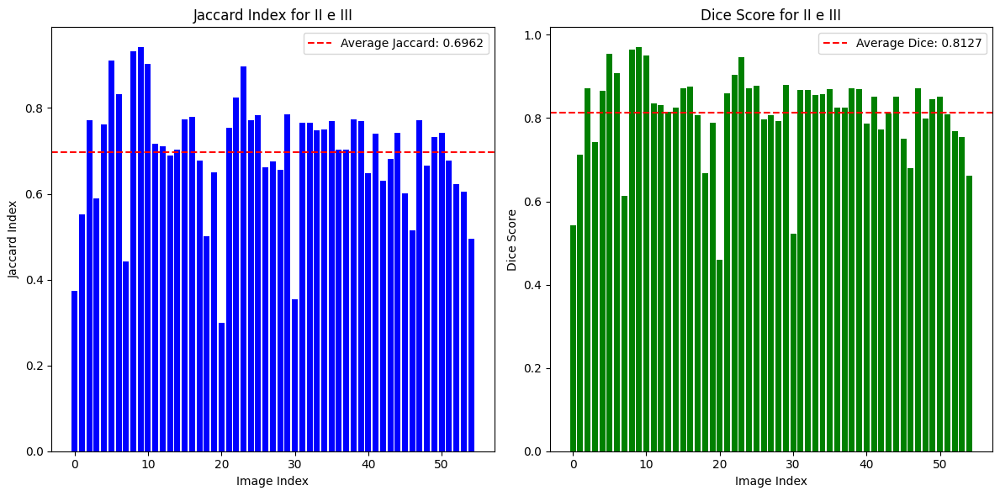

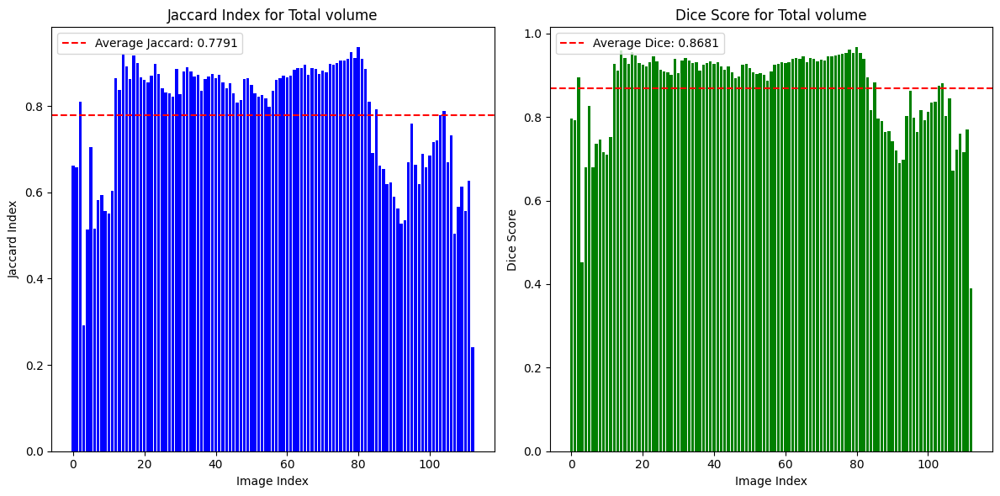

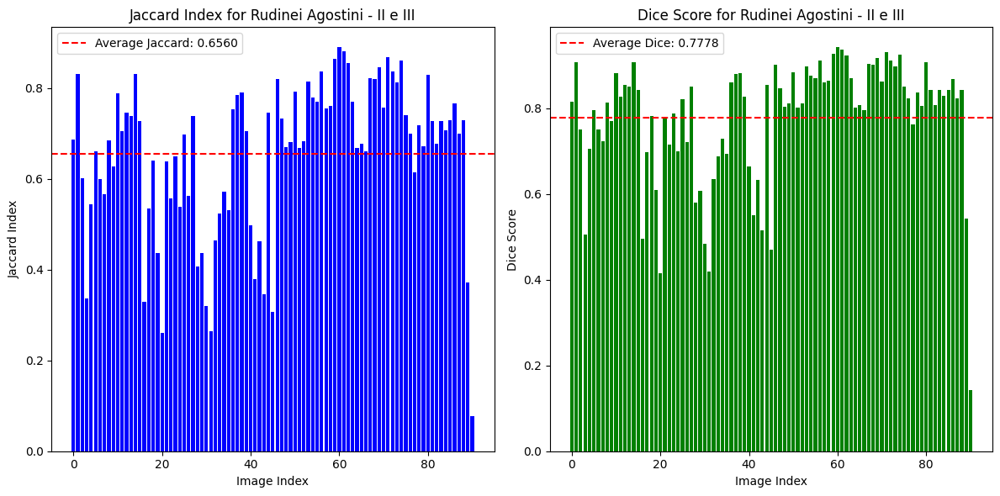

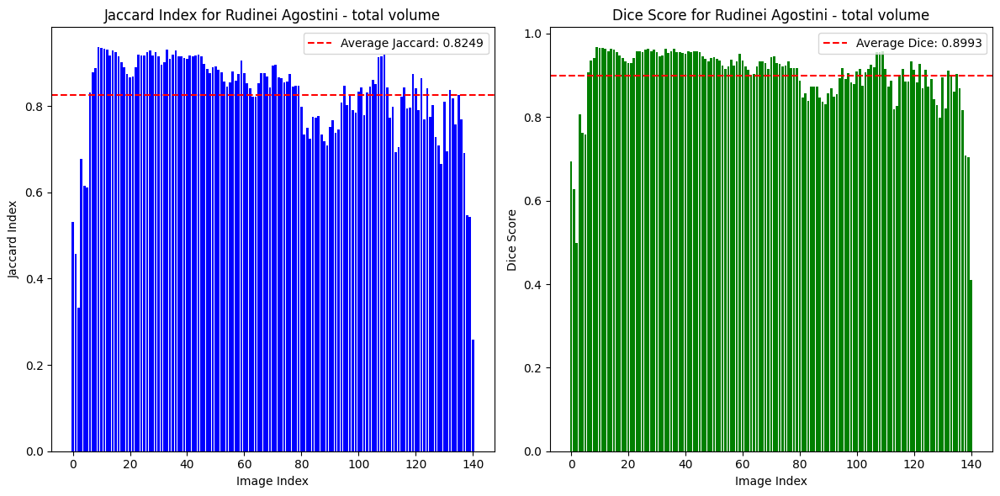

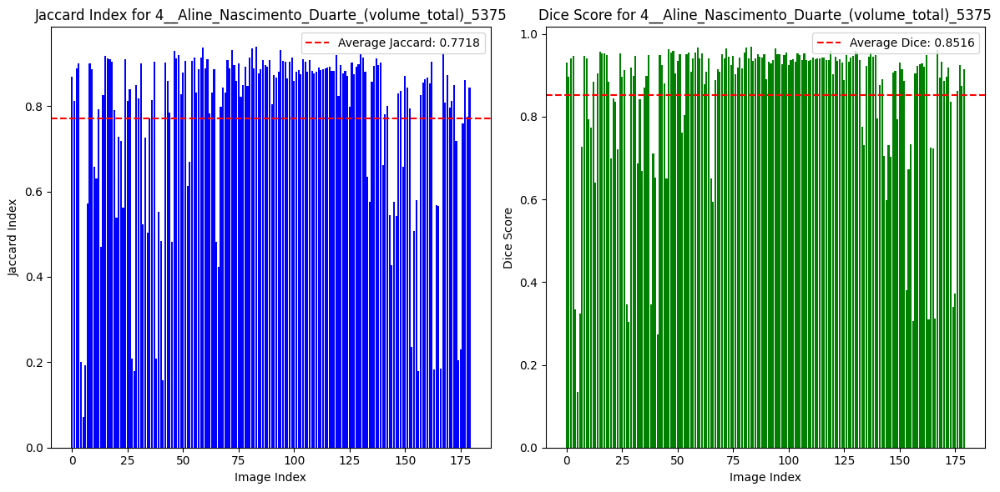

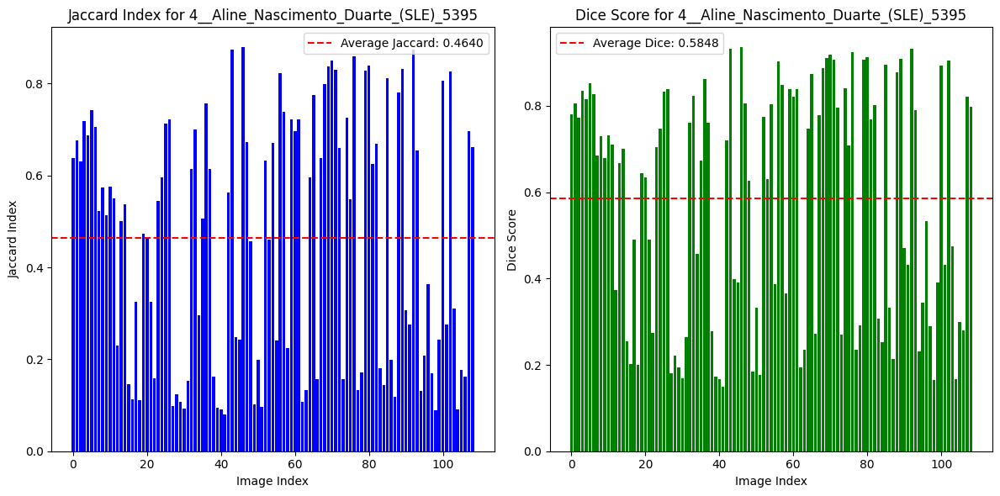

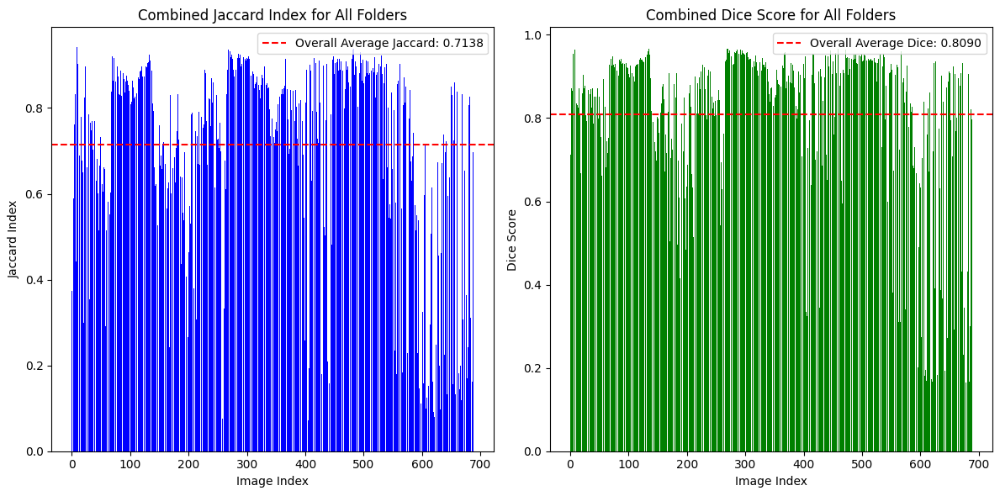

In [ ]:
import os
import numpy as np
import pydicom
import matplotlib.pyplot as plt
from sklearn.metrics import jaccard_score, f1_score, confusion_matrix
import cv2
import logging
from pydicom.errors import InvalidDicomError
from skimage.segmentation import clear_border
from skimage.measure import label, regionprops
from scipy.ndimage import binary_closing, binary_opening, binary_dilation, binary_erosion

# Function to calculate Jaccard index, Dice score, and confusion matrix for a single image
def calculate_metrics_and_confusion(ground_truth_mask, predicted_mask):
    if ground_truth_mask is None or predicted_mask is None:
        # Skip evaluation if any mask is missing
        return None, None, None, None, None, None

    if np.sum(predicted_mask) == 0:
        # If the predicted mask is empty, return zeros for all metrics
        return 0.0, 0.0, 0, 0, np.sum(ground_truth_mask), 0

    # Flattening the masks to 1D arrays for comparison
    ground_truth_flat = ground_truth_mask.flatten()
    predicted_flat = predicted_mask.flatten()

    # Calculating Jaccard Index (Intersection over Union)
    jaccard = jaccard_score(ground_truth_flat, predicted_flat)

    # Calculating Dice Score (F1 Score)
    dice = f1_score(ground_truth_flat, predicted_flat)

    # Calculating Confusion Matrix
    tn, fp, fn, tp = confusion_matrix(ground_truth_flat, predicted_flat, labels=[0, 1]).ravel()

    return jaccard, dice, tn, fp, fn, tp

# Function to get the true mask based on the contours (ground truth mask)
def get_true_mask_from_contours(image, color_ranges):
    true_mask = np.zeros(image.shape[:2], dtype=np.uint8)  # Initialize empty mask

    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    for color_name, (lower_range, upper_range) in color_ranges.items():
        lower_bound = np.array(lower_range)
        upper_bound = np.array(upper_range)

        # Creating mask for each color range
        mask = cv2.inRange(hsv_image, lower_bound, upper_bound)

        # Finding contours
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        if contours:
            # Filling the contours to create a binary mask
            cv2.drawContours(true_mask, contours, -1, (255), thickness=cv2.FILLED)

    return (true_mask > 0).astype(np.uint8) if np.any(true_mask) else None  # Return a binary mask or None if empty

# Function to generate bounding box from contours in the image
def get_bounding_box_from_contours(image, color_ranges):
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    for color_name, (lower_range, upper_range) in color_ranges.items():
        lower_bound = np.array(lower_range)
        upper_bound = np.array(upper_range)

        # Creating mask for each color range
        mask = cv2.inRange(hsv_image, lower_bound, upper_bound)

        # Finding contours
        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        if contours:
            # Getting the bounding box for the largest contour
            contour = max(contours, key=cv2.contourArea)  # Take the largest contour
            x, y, w, h = cv2.boundingRect(contour)
            return y, x, y + h, x + w  # min_row, min_col, max_row, max_col

    return None  # If no contours are found

# Post-processing function for the predicted mask
def post_process_mask(mask, min_size=100):
    mask = clear_border(mask).astype(np.uint8)
    mask = binary_closing(mask, structure=np.ones((7,7))).astype(np.uint8)
    mask = binary_opening(mask, structure=np.ones((7,7))).astype(np.uint8)
    mask = binary_dilation(mask, structure=np.ones((5,5))).astype(np.uint8)
    mask = binary_erosion(mask, structure=np.ones((5,5))).astype(np.uint8)

    labeled_mask = label(mask)
    for region in regionprops(labeled_mask):
        if region.area < min_size:
            mask[labeled_mask == region.label] = 0
    return mask

# Function to generate the predicted mask (this is where your SAM model's prediction happens)
def predict_new_image(image_path, color_ranges):
    try:
        dicom = pydicom.dcmread(image_path)
        image = dicom.pixel_array

        # Normalize the image for processing
        image = ((image - image.min()) / (image.max() - image.min()) * 255).astype(np.uint8)

        # Ensure image has at least 2 dimensions
        if image.ndim == 2:
            # Convert single-channel (grayscale) images to 3-channel (RGB)
            image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
        elif image.ndim == 3 and image.shape[-1] == 1:
            # If it's a single channel in a 3D array, convert to 3 channels
            image = np.repeat(image, 3, axis=-1)
        elif image.ndim == 3 and image.shape[-1] != 3:
            raise ValueError(f"Unexpected number of channels ({image.shape[-1]}) in input image")

        # Getting the bounding box based on the contour
        bounding_box = get_bounding_box_from_contours(image, color_ranges)
        if bounding_box is None:
            logging.warning(f"No marked region detected in image {image_path}.")
            return None, None

        min_row, min_col, max_row, max_col = bounding_box
        prompt_box = np.array([min_col, min_row, max_col, max_row])

        # Setting image for SAM model
        predictor.set_image(image)

        # Example point input for SAM
        center_point = np.array([(min_col + max_col) // 2, (min_row + max_row) // 2])
        prompts = [
            {"box": prompt_box[None, :]},
            {"point_coords": center_point[None, :], "point_labels": np.array([1])},
            {"point_coords": np.array([[min_col, min_row], [max_col, max_row]]), "point_labels": np.array([1, 1])},
        ]

        all_masks = []
        all_scores = []
        for prompt in prompts:
            masks, scores, _ = predictor.predict(**prompt, multimask_output=True)
            all_masks.extend(masks)
            all_scores.extend(scores)

        weighted_masks = np.average(all_masks, axis=0, weights=all_scores)
        predicted_mask = weighted_masks > 0.3

        if np.sum(predicted_mask) == 0:
            return image, None  # No valid mask, return None

        return image, post_process_mask(predicted_mask)
    except Exception as e:
        logging.error(f"Error processing image {image_path}: {str(e)}")
        return None, None

# Main function to process images, generate true mask, and compare with the predicted mask
def process_images_and_compare(dicom_folder_path, color_ranges):
    results_by_folder = {}

    for folder_name in os.listdir(dicom_folder_path):
        folder_path = os.path.join(dicom_folder_path, folder_name)
        if os.path.isdir(folder_path):
            jaccard_scores = []
            dice_scores = []
            total_tn, total_fp, total_fn, total_tp = 0, 0, 0, 0
            image_count = 0

            for root, _, files in os.walk(folder_path):
                for file in files:
                    if file.lower().endswith('.dcm'):
                        dicom_file_path = os.path.join(root, file)
                        try:
                            print(f"Processing {dicom_file_path}...")

                            dicom = pydicom.dcmread(dicom_file_path)
                            image = dicom.pixel_array

                            # Normalize the image for processing
                            image = ((image - image.min()) / (image.max() - image.min()) * 255).astype(np.uint8)

                            if image.ndim == 2:
                                image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)

                            # Get true mask from contours
                            true_mask = get_true_mask_from_contours(image, color_ranges)

                            # Predict the mask for the current image using SAM model
                            new_image, predicted_mask = predict_new_image(dicom_file_path, color_ranges)

                            # Calculate Jaccard, Dice scores, and confusion matrix for this image
                            jaccard, dice, tn, fp, fn, tp = calculate_metrics_and_confusion(true_mask, predicted_mask)

                            if jaccard is not None and dice is not None:
                                # Only include in the final metrics if the scores are valid
                                total_tn += tn
                                total_fp += fp
                                total_fn += fn
                                total_tp += tp
                                jaccard_scores.append(jaccard)
                                dice_scores.append(dice)
                                image_count += 1
                                print(f"Processed {file}: Jaccard = {jaccard:.4f}, Dice = {dice:.4f}")

                        except InvalidDicomError:
                            print(f"Skipping invalid DICOM file: {dicom_file_path}")
                        except Exception as e:
                            logging.error(f"Error processing file {dicom_file_path}: {str(e)}")

            # Calculating and store average Jaccard and Dice scores for this folder
            if image_count > 0:
                avg_jaccard = np.mean(jaccard_scores)
                avg_dice = np.mean(dice_scores)
            else:
                avg_jaccard = 0.0
                avg_dice = 0.0

            # Storing results for this folder
            results_by_folder[folder_name] = {
                "jaccard_scores": jaccard_scores,
                "dice_scores": dice_scores,
                "avg_jaccard": avg_jaccard,
                "avg_dice": avg_dice,
                "total_tn": total_tn,
                "total_fp": total_fp,
                "total_fn": total_fn,
                "total_tp": total_tp,
                "image_count": image_count,
            }

    # Plotting results for each folder
    for folder_name, results in results_by_folder.items():
        plt.figure(figsize=(12, 6))

        # Plotting Jaccard Scores
        plt.subplot(1, 2, 1)
        plt.bar(range(len(results["jaccard_scores"])), results["jaccard_scores"], color='blue')
        plt.axhline(y=results["avg_jaccard"], color='r', linestyle='--', label=f'Average Jaccard: {results["avg_jaccard"]:.4f}')
        plt.xlabel('Image Index')
        plt.ylabel('Jaccard Index')
        plt.title(f'Jaccard Index for {folder_name}')
        plt.legend()

        # Plotting Dice Scores
        plt.subplot(1, 2, 2)
        plt.bar(range(len(results["dice_scores"])), results["dice_scores"], color='green')
        plt.axhline(y=results["avg_dice"], color='r', linestyle='--', label=f'Average Dice: {results["avg_dice"]:.4f}')
        plt.xlabel('Image Index')
        plt.ylabel('Dice Score')
        plt.title(f'Dice Score for {folder_name}')
        plt.legend()

        plt.tight_layout()
        plt.show()

    # Plotting combined results for all folders
    all_jaccard_scores = []
    all_dice_scores = []
    for results in results_by_folder.values():
        all_jaccard_scores.extend(results["jaccard_scores"])
        all_dice_scores.extend(results["dice_scores"])

    if all_jaccard_scores and all_dice_scores:
        overall_avg_jaccard = np.mean(all_jaccard_scores)
        overall_avg_dice = np.mean(all_dice_scores)

        plt.figure(figsize=(12, 6))

        # Plot Combined Jaccard Scores
        plt.subplot(1, 2, 1)
        plt.bar(range(len(all_jaccard_scores)), all_jaccard_scores, color='blue')
        plt.axhline(y=overall_avg_jaccard, color='r', linestyle='--', label=f'Overall Average Jaccard: {overall_avg_jaccard:.4f}')
        plt.xlabel('Image Index')
        plt.ylabel('Jaccard Index')
        plt.title('Combined Jaccard Index for All Folders')
        plt.legend()

        # Plotting Combined Dice Scores
        plt.subplot(1, 2, 2)
        plt.bar(range(len(all_dice_scores)), all_dice_scores, color='green')
        plt.axhline(y=overall_avg_dice, color='r', linestyle='--', label=f'Overall Average Dice: {overall_avg_dice:.4f}')
        plt.xlabel('Image Index')
        plt.ylabel('Dice Score')
        plt.title('Combined Dice Score for All Folders')
        plt.legend()

        plt.tight_layout()
        plt.show()

# Color ranges dictionary for multiple colors
color_ranges = {
    'green': ([35, 40, 40], [85, 255, 255]),
    'red1': ([0, 50, 50], [10, 255, 255]),
    'red2': ([170, 50, 50], [180, 255, 255]),
    'blue': ([100, 50, 50], [130, 255, 255]),
    'yellow': ([20, 100, 100], [30, 255, 255]),
    'cyan': ([80, 50, 50], [100, 255, 255]),
    'magenta': ([140, 50, 50], [160, 255, 255]),
    'brown': ([10, 50, 50], [20, 255, 255]),
    'orange': ([10, 100, 100], [25, 255, 255]),
    'pink': ([150, 50, 50], [170, 255, 255]),
    'violet': ([130, 50, 50], [160, 255, 255])
}

# Path where DICOM files are stored
extracted_dicom_folder = '/content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images'

# Running the comparison process
process_images_and_compare(extracted_dicom_folder, color_ranges)


# Saving the Data of images for comparison in the drive

Explanation to the code - This code processes DICOM images to evaluate segmentation performance using the SAM-Med2D model. It compares predicted masks with true masks, which are generated based on predefined color ranges, and computes metrics such as Jaccard Index, Dice Score, and confusion matrix. The true mask is extracted from contours in the image, while the SAM-Med2D model generates the predicted mask. After processing, it saves the original image, true mask, and predicted mask as PNG files and visualizes the evaluation results with bar charts for each folder. The results are stored in an output folder for further analysis.

In [ ]:
# importing all necessary files
import os
import numpy as np
import pydicom
import torch
import matplotlib.pyplot as plt
from sklearn.metrics import jaccard_score, f1_score, confusion_matrix
import cv2
import logging
from pydicom.errors import InvalidDicomError
from skimage.segmentation import clear_border
from skimage.measure import label, regionprops
from scipy.ndimage import binary_closing, binary_opening, binary_dilation, binary_erosion

# Importing SAM-Med2D model
from SAM_Med2D.segment_anything import sam_model_registry
from SAM_Med2D.segment_anything.predictor_sammed import SammedPredictor

# Setting up SAM-Med2D model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
args = Namespace()
args.image_size = 256
args.encoder_adapter = True
args.sam_checkpoint = "/content/SAM_Med2D/pretrain_model/sam-med2d_b.pth"  # Update with correct path
model = sam_model_registry["vit_b"](args).to(device)
predictor = SammedPredictor(model)

# Function to calculate Jaccard index, Dice score, and confusion matrix for a single image
def calculate_metrics_and_confusion(ground_truth_mask, predicted_mask):
    if ground_truth_mask is None or predicted_mask is None:
        return None, None, None, None, None, None

    if np.sum(predicted_mask) == 0:
        return 0.0, 0.0, 0, 0, np.sum(ground_truth_mask), 0

    ground_truth_flat = ground_truth_mask.flatten()
    predicted_flat = predicted_mask.flatten()

    jaccard = jaccard_score(ground_truth_flat, predicted_flat)
    dice = f1_score(ground_truth_flat, predicted_flat)

    tn, fp, fn, tp = confusion_matrix(ground_truth_flat, predicted_flat, labels=[0, 1]).ravel()

    return jaccard, dice, tn, fp, fn, tp

# Function to get the true mask based on the contours
def get_true_mask_from_contours(image, color_ranges):
    true_mask = np.zeros(image.shape[:2], dtype=np.uint8)

    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    for color_name, (lower_range, upper_range) in color_ranges.items():
        lower_bound = np.array(lower_range)
        upper_bound = np.array(upper_range)

        mask = cv2.inRange(hsv_image, lower_bound, upper_bound)

        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        if contours:
            cv2.drawContours(true_mask, contours, -1, (255), thickness=cv2.FILLED)

    return (true_mask > 0).astype(np.uint8) if np.any(true_mask) else None

# Function to generate bounding box from contours in the image
def get_bounding_box_from_contours(image, color_ranges):
    hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

    for color_name, (lower_range, upper_range) in color_ranges.items():
        lower_bound = np.array(lower_range)
        upper_bound = np.array(upper_range)

        mask = cv2.inRange(hsv_image, lower_bound, upper_bound)

        contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

        if contours:
            contour = max(contours, key=cv2.contourArea)
            x, y, w, h = cv2.boundingRect(contour)
            return y, x, y + h, x + w

    return None

# Post-processing function for the predicted mask
def post_process_mask(mask, min_size=100):
    mask = clear_border(mask).astype(np.uint8)
    mask = binary_closing(mask, structure=np.ones((7,7))).astype(np.uint8)
    mask = binary_opening(mask, structure=np.ones((7,7))).astype(np.uint8)
    mask = binary_dilation(mask, structure=np.ones((5,5))).astype(np.uint8)
    mask = binary_erosion(mask, structure=np.ones((5,5))).astype(np.uint8)

    labeled_mask = label(mask)
    for region in regionprops(labeled_mask):
        if region.area < min_size:
            mask[labeled_mask == region.label] = 0
    return mask

# Function to generate the predicted mask (this is where your SAM model's prediction happens)
def predict_new_image(image_path, color_ranges):
    try:
        dicom = pydicom.dcmread(image_path)
        image = dicom.pixel_array

        if image.dtype not in [np.uint8, np.uint16, np.float32, np.float64]:
            raise ValueError(f"Unsupported image data type: {image.dtype}")

        image = ((image - image.min()) / (image.max() - image.min()) * 255).astype(np.uint8)

        if image.ndim == 2:
            image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
        elif image.ndim == 3 and image.shape[-1] == 1:
            image = np.repeat(image, 3, axis=-1)
        elif image.ndim == 3 and image.shape[-1] != 3:
            raise ValueError(f"Unexpected number of channels ({image.shape[-1]}) in input image")

        bounding_box = get_bounding_box_from_contours(image, color_ranges)
        if bounding_box is None:
            logging.warning(f"No marked region detected in image {image_path}.")
            return image, None

        min_row, min_col, max_row, max_col = bounding_box
        prompt_box = np.array([min_col, min_row, max_col, max_row])

        predictor.set_image(image)

        center_point = np.array([(min_col + max_col) // 2, (min_row + max_row) // 2])
        prompts = [
            {"box": prompt_box[None, :]},
            {"point_coords": center_point[None, :], "point_labels": np.array([1])},
            {"point_coords": np.array([[min_col, min_row], [max_col, max_row]]), "point_labels": np.array([1, 1])},
        ]

        all_masks = []
        all_scores = []
        for prompt in prompts:
            masks, scores, _ = predictor.predict(**prompt, multimask_output=True)
            all_masks.extend(masks)
            all_scores.extend(scores)

        weighted_masks = np.average(all_masks, axis=0, weights=all_scores)
        predicted_mask = weighted_masks > 0.3

        if np.sum(predicted_mask) == 0:
            return image, None

        return image, post_process_mask(predicted_mask)
    except Exception as e:
        logging.error(f"Error processing image {image_path}: {str(e)}")
        return None, None

# Function to save the original image, true mask, and predicted mask as a PNG
def save_results(image, true_mask, predicted_mask, output_path, filename):
    plt.figure(figsize=(12, 4))

    plt.subplot(1, 3, 1)
    plt.imshow(image, cmap='gray')
    plt.title("Original Image")
    plt.axis('off')

    plt.subplot(1, 3, 2)
    if true_mask is not None:
        plt.imshow(true_mask, cmap='gray')
        plt.title("True Mask")
    else:
        plt.title("True Mask (Not Available)")
    plt.axis('off')

    plt.subplot(1, 3, 3)
    if predicted_mask is not None:
        plt.imshow(predicted_mask, cmap='gray')
        plt.title("Predicted Mask")
    else:
        plt.title("Predicted Mask (Not Available)")
    plt.axis('off')

    plt.tight_layout()
    plt.savefig(os.path.join(output_path, f"{filename}.png"))
    plt.close()

# Main function to process images, generate true mask, and compare with the predicted mask
def process_images_and_compare(dicom_folder_path, color_ranges, output_folder):
    results_by_folder = {}

    for folder_name in os.listdir(dicom_folder_path):
        folder_path = os.path.join(dicom_folder_path, folder_name)
        if os.path.isdir(folder_path):
            jaccard_scores = []
            dice_scores = []
            total_tn, total_fp, total_fn, total_tp = 0, 0, 0, 0
            image_count = 0

            for root, _, files in os.walk(folder_path):
                for file in files:
                    if file.lower().endswith('.dcm'):
                        dicom_file_path = os.path.join(root, file)
                        try:
                            print(f"Processing {dicom_file_path}...")

                            dicom = pydicom.dcmread(dicom_file_path)
                            image = dicom.pixel_array

                            image = ((image - image.min()) / (image.max() - image.min()) * 255).astype(np.uint8)

                            if image.ndim == 2:
                                image = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)

                            true_mask = get_true_mask_from_contours(image, color_ranges)

                            new_image, predicted_mask = predict_new_image(dicom_file_path, color_ranges)

                            save_results(new_image, true_mask, predicted_mask, output_folder, os.path.basename(dicom_file_path).replace('.dcm', ''))

                            # Calculating Jaccard, Dice scores, and confusion matrix for this image
                            jaccard, dice, tn, fp, fn, tp = calculate_metrics_and_confusion(true_mask, predicted_mask)

                            if jaccard is not None and dice is not None:

                                total_tn += tn
                                total_fp += fp
                                total_fn += fn
                                total_tp += tp
                                jaccard_scores.append(jaccard)
                                dice_scores.append(dice)
                                image_count += 1
                                print(f"Processed {file}: Jaccard = {jaccard:.4f}, Dice = {dice:.4f}")

                        except InvalidDicomError:
                            print(f"Skipping invalid DICOM file: {dicom_file_path}")
                        except Exception as e:
                            logging.error(f"Error processing file {dicom_file_path}: {str(e)}")

            # Calculating and store average Jaccard and Dice scores for this folder
            if image_count > 0:
                avg_jaccard = np.mean(jaccard_scores)
                avg_dice = np.mean(dice_scores)
            else:
                avg_jaccard = 0.0
                avg_dice = 0.0

            # Storing results for this folder
            results_by_folder[folder_name] = {
                "jaccard_scores": jaccard_scores,
                "dice_scores": dice_scores,
                "avg_jaccard": avg_jaccard,
                "avg_dice": avg_dice,
                "total_tn": total_tn,
                "total_fp": total_fp,
                "total_fn": total_fn,
                "total_tp": total_tp,
                "image_count": image_count,
            }

    # Plotting results for each folder
    for folder_name, results in results_by_folder.items():
        plt.figure(figsize=(12, 6))

        # Plotting Jaccard Scores
        plt.subplot(1, 2, 1)
        plt.bar(range(len(results["jaccard_scores"])), results["jaccard_scores"], color='blue')
        plt.axhline(y=results["avg_jaccard"], color='r', linestyle='--', label=f'Average Jaccard: {results["avg_jaccard"]:.4f}')
        plt.xlabel('Image Index')
        plt.ylabel('Jaccard Index')
        plt.title(f'Jaccard Index for {folder_name}')
        plt.legend()

        # Plotting Dice Scores
        plt.subplot(1, 2, 2)
        plt.bar(range(len(results["dice_scores"])), results["dice_scores"], color='green')
        plt.axhline(y=results["avg_dice"], color='r', linestyle='--', label=f'Average Dice: {results["avg_dice"]:.4f}')
        plt.xlabel('Image Index')
        plt.ylabel('Dice Score')
        plt.title(f'Dice Score for {folder_name}')
        plt.legend()

        plt.tight_layout()
        plt.show()

    # Plotting combined results for all folders
    all_jaccard_scores = []
    all_dice_scores = []
    for results in results_by_folder.values():
        all_jaccard_scores.extend(results["jaccard_scores"])
        all_dice_scores.extend(results["dice_scores"])

    if all_jaccard_scores and all_dice_scores:
        overall_avg_jaccard = np.mean(all_jaccard_scores)
        overall_avg_dice = np.mean(all_dice_scores)

        plt.figure(figsize=(12, 6))

        # Plotting Combined Jaccard Scores
        plt.subplot(1, 2, 1)
        plt.bar(range(len(all_jaccard_scores)), all_jaccard_scores, color='blue')
        plt.axhline(y=overall_avg_jaccard, color='r', linestyle='--', label=f'Overall Average Jaccard: {overall_avg_jaccard:.4f}')
        plt.xlabel('Image Index')
        plt.ylabel('Jaccard Index')
        plt.title('Combined Jaccard Index for All Folders')
        plt.legend()

        # Plotting Combined Dice Scores
        plt.subplot(1, 2, 2)
        plt.bar(range(len(all_dice_scores)), all_dice_scores, color='green')
        plt.axhline(y=overall_avg_dice, color='r', linestyle='--', label=f'Overall Average Dice: {overall_avg_dice:.4f}')
        plt.xlabel('Image Index')
        plt.ylabel('Dice Score')
        plt.title('Combined Dice Score for All Folders')
        plt.legend()

        plt.tight_layout()
        plt.show()

# Color ranges dictionary for multiple colors
color_ranges = {
    'green': ([35, 40, 40], [85, 255, 255]),
    'red1': ([0, 50, 50], [10, 255, 255]),
    'red2': ([170, 50, 50], [180, 255, 255]),
    'blue': ([100, 50, 50], [130, 255, 255]),
    'yellow': ([20, 100, 100], [30, 255, 255]),
    'cyan': ([80, 50, 50], [100, 255, 255]),
    'magenta': ([140, 50, 50], [160, 255, 255]),
    'brown': ([10, 50, 50], [20, 255, 255]),
    'orange': ([10, 100, 100], [25, 255, 255]),
    'pink': ([150, 50, 50], [170, 255, 255]),
    'violet': ([130, 50, 50], [160, 255, 255])
}

# Path where DICOM files are stored
extracted_dicom_folder = '/content/drive/MyDrive/01 ECS8056  Project Folder/All Dicom Images'

# Output folder where results will be saved
output_folder = '/content/drive/MyDrive/01 ECS8056  Project Folder/Results'

# Ensuring the output folder exists
os.makedirs(output_folder, exist_ok=True)

# Running the comparison process and save images
process_images_and_compare(extracted_dicom_folder, color_ranges, output_folder)
